In [45]:
from sklearn.utils import shuffle 
import os
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn import model_selection
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc,roc_auc_score
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score,train_test_split,cross_validate, StratifiedKFold
from sklearn.utils  import shuffle
import joblib
import warnings
from sklearn.exceptions import DataConversionWarning
# 忽略特定类型的警告
warnings.filterwarnings("ignore", category=DataConversionWarning)

In [46]:
from matplotlib import font_manager, pyplot as plt

# 查找系统中所有可用的Times New Roman字体的路径
times_new_roman = font_manager.findSystemFonts(fontpaths=None, fontext='ttf')
# 从列表中找到一个指定的字体名称，并确保字体能支持加粗
t_nr_path = [f for f in times_new_roman if 'Times New Roman' in f and 'Bold' in f]

if t_nr_path:
    # 如果找到了Times New Roman Bold字体，设置为默认字体
    prop = font_manager.FontProperties(fname=t_nr_path[0])
    plt.rcParams['font.family'] = prop.get_name()
    plt.rcParams['font.weight'] = 'bold'  # 设置字体为加粗
else:
    # 如果没有找到加粗的Times New Roman，尝试设置为普通的Times New Roman并加粗
    t_nr_path = [f for f in times_new_roman if 'Times New Roman' in f]
    if t_nr_path:
        prop = font_manager.FontProperties(fname=t_nr_path[0])
        plt.rcParams['font.family'] = prop.get_name()
        plt.rcParams['font.weight'] = 'bold'
    else:
        # 如果没有找到Times New Roman，使用默认的衬线字体并设置为加粗
        plt.rcParams['font.family'] = 'serif'
        plt.rcParams['font.weight'] = 'bold'

In [47]:
# 检查当前工作目录
current_directory = os.getcwd()
print("当前工作目录:", current_directory)

当前工作目录: /home/md06/public/jupytercode/kxy/1-数据集568/2-参数搜索/APFPs


#### 数据处理

In [ ]:
#划分数据集
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale
data = pd.read_csv('全部筛选过后数据-14.csv')
x = data.iloc[:,2:] ###描述符
y = data["bioactivity_class"]   #标签
chembl_id = data["molecule_chembl_id"]  # Chembl ID
#x_mor_train和x_mor_test分别为训练集和测试集中的特征数据，y_mor_train和y_mor_test分别为训练集和测试集中的目标变量数据。
x_train, x_test, y_train, y_test, x_chembl_id, y_chembl_id = train_test_split(x, y, chembl_id, test_size=0.2,  
                                                  #test_size=0.2: 测试集大小占总数据的20%。
                                                  #stratify=y: 划分时保持y中的类别比例，确保训练集和测试集中各类别的比例与原始数据集相同。
                                                       stratify=y, 
                                                  #设置随机数种子以确保结果的可重复性。
                                                       random_state=13)  

In [ ]:
# 查看划分后数据集的大小
print("训练集特征维度:", x_train.shape)
print("训练集目标维度:",y_train.shape)
print("测试集特征维度:", x_test.shape)
print("测试集目标维度:", y_test.shape)

In [ ]:
# 保存训练集特征
x_train.to_csv('train_features.csv', index=False)
# 保存训练集目标变量
y_train.to_csv('train_target.csv', index=False)
x_chembl_id.to_csv('train_chembl_id.csv', index=False)

# 保存测试集特征
x_test.to_csv('test_features.csv', index=False)
# 保存测试集目标变量
y_test.to_csv('test_target.csv', index=False)
y_chembl_id.to_csv('test_chembl_id.csv', index=False)

In [ ]:
# 组合训练集的特征、目标变量和Chembl ID
train_data = pd.concat([x_chembl_id, y_train, x_train], axis=1)
# 保存训练数据集
train_data.to_csv('train_dataset.csv', index=False)

# 组合测试集的特征、目标变量和Chembl ID
test_data = pd.concat([y_chembl_id,y_test, x_test], axis=1)
# 保存测试数据集
test_data.to_csv('test_dataset.csv', index=False)

#### 数据读入

In [48]:
data = pd.read_csv('train-dataset-apfps.csv')
data2 = pd.read_csv('test-dataset-apfps.csv')

x_mor_train = data.iloc[:,2:]   #第三列以后的数据，Python中索引是从0开始的，读取描述符
y_mor_train = data.iloc[:,1:2]  #左开右闭，读取第二列的数据 ，读取标签
x_mor_test = data2.iloc[:,2:]
y_mor_test = data2.iloc[:,1:2]

In [49]:
X = x_mor_train    #x_mor_train 是输入特征，
Y = y_mor_train    #y_mor_train 是对应的目标变量（即标签）。
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)    
#K折交叉验证（Stratified K-Fold Cross Validation）
#shuffle=True 表示在每次分割前都会对数据进行随机洗牌
#random_state=0 是设置随机种子，确保结果的可重复性。

# AdaBoost参数搜索

In [7]:
from sklearn.ensemble import AdaBoostClassifier
n_estimators_range=[int(x) for x in np.linspace(start=10,stop=510,num=100)]
def AdaBoostClassifier_model(X,Y):

    # 首先实例化各个回归方法
    AdaBoostClassifier_auto = AdaBoostClassifier(random_state=0)
    param_dict = { "n_estimators":n_estimators_range,
                  "learning_rate":[0,0.5,1,1.5,2],
                 "algorithm":['SAMME', 'SAMME.R']}
    estimator = GridSearchCV(estimator = AdaBoostClassifier_auto, param_grid=param_dict, cv=cv,n_jobs=-1,scoring = "roc_auc")
    estimator.fit(X,Y)
    return estimator.best_params_,estimator.best_score_,estimator.best_estimator_

tmp_1,tmp_2,AdaBoostClassifier_auto = AdaBoostClassifier_model(X,Y)
print(tmp_1,tmp_2,AdaBoostClassifier_auto)

/home/md06/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to

{'algorithm': 'SAMME.R', 'learning_rate': 1.5, 'n_estimators': 227} 0.9147811040792625 AdaBoostClassifier(learning_rate=1.5, n_estimators=227, random_state=0)


In [8]:
print(tmp_1,tmp_2,AdaBoostClassifier_auto)

{'algorithm': 'SAMME.R', 'learning_rate': 1.5, 'n_estimators': 227} 0.9147811040792625 AdaBoostClassifier(learning_rate=1.5, n_estimators=227, random_state=0)


### 混淆矩阵  AUC-ROC   PR-AUC

训练集准确度是0.986784140969163
测试集准确度是0.7982456140350878


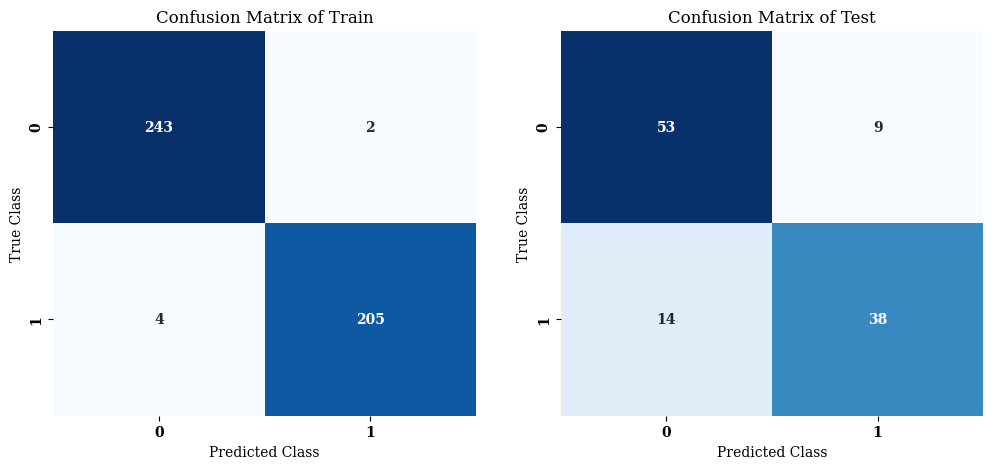

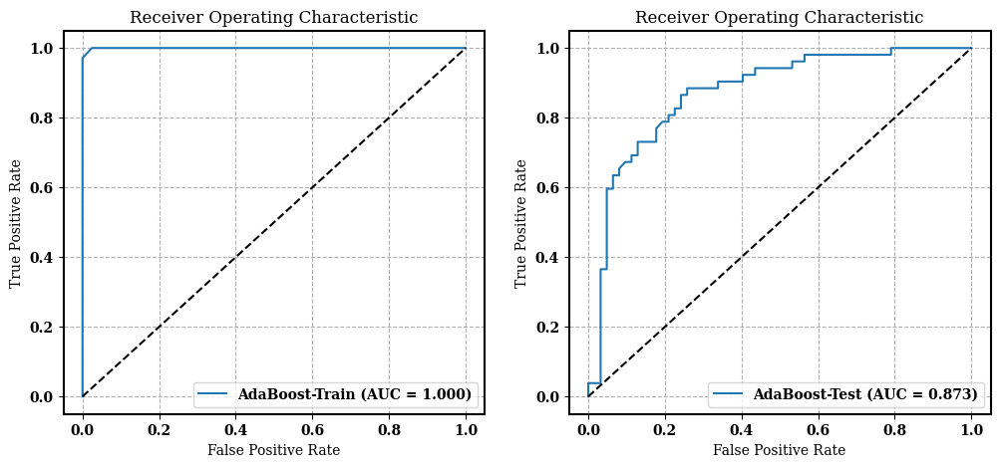

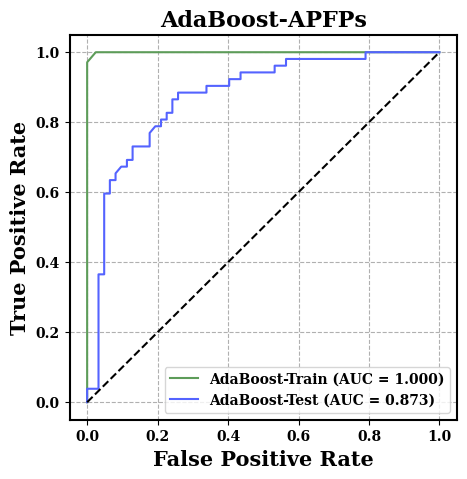

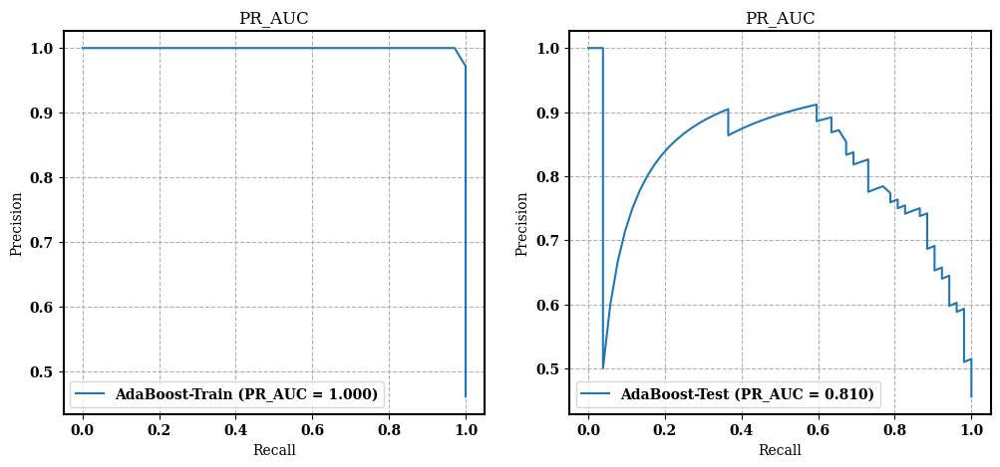

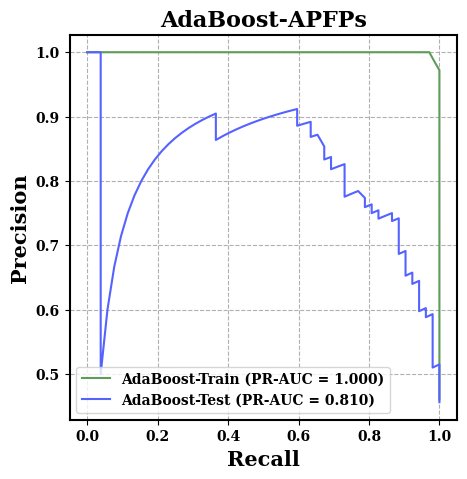

In [9]:
from sklearn.ensemble import AdaBoostClassifier
train_X = x_mor_train
train_Y = y_mor_train
test_X = x_mor_test
test_Y = y_mor_test

Ada = AdaBoostClassifier(random_state = 0,
                         algorithm = 'SAMME.R',
                         learning_rate = 1.5,
                         n_estimators = 227)


estimator = Ada
estimator.fit(train_X, train_Y)
clf_train = estimator.predict(train_X)
clf_test = estimator.predict(test_X)
print(f"训练集准确度是{accuracy_score(train_Y,clf_train)}")
print(f"测试集准确度是{accuracy_score(test_Y,clf_test)}")

train_matrix = confusion_matrix(train_Y, clf_train)
test_matrix = confusion_matrix(test_Y, clf_test)

plt.rc('axes', linewidth=1.5)

# 绘制热图
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)  #创建了一个包含两个子图的图形，排列方式为一行两列
sns.heatmap(train_matrix, annot=True, cmap="Blues", cbar=None,
            fmt="d")  #cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Train")

plt.subplot(1, 2, 2)
sns.heatmap(test_matrix, annot=True, cmap="Blues", cbar=None,
            fmt="d")  #cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Test")
plt.savefig("./AdaBoost/混淆矩阵_Ada.svg", dpi = 600)
plt.show()

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(12, 5))

# 绘制训练集 ROC 图
plt.subplot(1, 2, 1)
y_pro_train = estimator.predict_proba(train_X)[:, 1]  # 获取训练集的预测概率
fpr_train, tpr_train, _ = roc_curve(train_Y, y_pro_train)  # 计算 ROC 曲线的参数
roc_auc_train = auc(fpr_train, tpr_train)  # 计算 AUC
plt.plot(fpr_train, tpr_train, label='AdaBoost-Train (AUC = %0.3f)' % roc_auc_train)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
# 绘制测试集 ROC 图
plt.subplot(1, 2, 2)
y_pro_test = estimator.predict_proba(test_X)[:, 1]  # 获取测试集的预测概率
fpr_test, tpr_test, _ = roc_curve(test_Y, y_pro_test)  # 计算 ROC 曲线的参数
roc_auc_test = auc(fpr_test, tpr_test)  # 计算 AUC
plt.plot(fpr_test, tpr_test, label='AdaBoost-Test (AUC = %0.3f)' % roc_auc_test)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
plt.savefig("./AdaBoost/ROC_Ada.svg", dpi=600)  # 保存图形为 SVG 格式文件
plt.show()  # 显示图形

##绘制组合图
plt.figure(figsize=(5, 5))
# 绘制 ROC 曲线
plt.plot(fpr_train, tpr_train, color='#5D9C59',label='AdaBoost-Train (AUC = %0.3f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test,  color='#5463FF',label='AdaBoost-Test (AUC = %0.3f)' % roc_auc_test)
# 绘制对角线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色
# 添加背景网格
plt.grid(True, linestyle='--')
# 设置标题和标签
plt.title('AdaBoost-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('False Positive Rate', fontweight='bold', fontsize=15)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize=15)
plt.legend(loc='lower right')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./AdaBoost/ROC_Ada_组合.svg", dpi=600)
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score, auc
import matplotlib.pyplot as plt

# 训练集PR_AUC图
plt.figure(figsize=(12, 5))
y_pro_train = estimator.predict_proba(train_X)[:, 1]
precision_train, recall_train, _ = precision_recall_curve(train_Y, y_pro_train, pos_label=1)
pr_auc_train = auc(recall_train, precision_train)
plt.subplot(1, 2, 1)
plt.plot(recall_train, precision_train, label='AdaBoost-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
# 测试集PR_AUC图
y_pro_test = estimator.predict_proba(test_X)[:, 1]
precision_test, recall_test, _ = precision_recall_curve(test_Y, y_pro_test, pos_label=1)
pr_auc_test = auc(recall_test, precision_test)
plt.subplot(1, 2, 2)
plt.plot(recall_test, precision_test, label='AdaBoost-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./AdaBoost/PR_Ada.svg", dpi=600)
plt.show()

## 绘制组合图
plt.figure(figsize=(5, 5))
# 绘制训练集PR_AUC图
plt.plot(recall_train, precision_train, color='#5D9C59',label='AdaBoost-Train (PR-AUC = {:.3f})'.format(pr_auc_train))
# 绘制测试集PR_AUC图
plt.plot(recall_test, precision_test, color='#5463FF', label='AdaBoost-Test (PR-AUC = {:.3f})'.format(pr_auc_test))
plt.title('AdaBoost-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('Recall', fontweight='bold', fontsize=15)
plt.ylabel('Precision', fontweight='bold', fontsize=15)
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./AdaBoost/PR_Ada_组合.svg", dpi=600)
plt.show()

### 交叉验证 测试集 

In [10]:
# 导入机器学习库scikit-learn中的Ada分类器和其他必要的工具包
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    roc_auc_score, f1_score, matthews_corrcoef, 
    make_scorer, confusion_matrix
)
import pandas as pd  # 导入数据处理库pandas
import numpy as np  # 导入数值计算库numpy

# 定义特异性评分函数
def specificity_score(y_true, y_pred):
    """计算特异性（Specificity）."""
    tn, fp, _, _ = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp) if (tn + fp) != 0 else 0

# 定义一个函数用于保存训练集交叉验证的分数到CSV文件，并且打印/保存平均值。
def save_cv_scores(scores, column_names, file_path, label):
    """将交叉验证的成绩保存到CSV文件中。"""
    data = pd.DataFrame(np.array(scores).reshape(1, -1), index=[label], columns=column_names)
    data['average'] = data.mean(axis=1)  # 计算平均分并添加为新列
    data.to_csv(file_path, index=False)  # 将DataFrame保存为CSV文件
    print(f"Data saved to {file_path}")  # 打印保存信息
    return data

# 定义一个函数来处理所有成绩指标并使用`save_cv_scores`函数保存它们。
# 修改process_all_scores函数，添加n_splits参数以反映正确的折数。
def process_all_scores(score_dict, algorithm_name, folder, n_splits):
    """处理所有成绩指标并将其保存到CSV文件中。"""
    results = {}
    for metric, values in score_dict.items():
        file_path = f"{folder}/{n_splits}-CV-{metric.upper()}.csv"  # 使用传入的n_splits来构造文件名
        columns = [str(i+1) for i in range(len(values))]  # 创建列名列表
        results[metric] = save_cv_scores(values, columns, file_path, algorithm_name)  # 保存成绩并添加到结果字典
    return results

Ada = AdaBoostClassifier(random_state = 0,
                         algorithm = 'SAMME.R',
                         learning_rate = 1.5,
                         n_estimators = 227)

# 使用Ada分类器进行训练和预测。
def train_and_evaluate(model, train_features, train_labels, test_features, test_labels):
    """训练模型并评估其在训练集和测试集上的性能。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    # 打印训练集和测试集的准确率
    print(f"Training Set Accuracy: {accuracy_score(train_labels, clf_train_preds)}")
    print(f"Test Set Accuracy: {accuracy_score(test_labels, clf_test_preds)}")

# 初始化用于训练和测试的特征和标签变量。
train_X, train_Y = x_mor_train, y_mor_train  # 训练集特征和标签
test_X, test_Y = x_mor_test, y_mor_test  # 测试集特征和标签

# 执行训练和评估。
train_and_evaluate(Ada, train_X, train_Y, test_X, test_Y)

# 定义一个函数进行交叉验证和成绩的保存。
# 修改perform_cross_validation函数的调用，传入n_splits参数。
def perform_cross_validation(model, train_features, train_labels, n_splits, folder):
    """执行交叉验证和成绩处理。"""
    cv_strategy = StratifiedKFold(n_splits=n_splits)  # 使用分层k折交叉验证
    # 定义评分方法
    scoring_methods = {
        'accuracy': 'accuracy',
        'precision': make_scorer(precision_score, average='macro'),
        'recall': make_scorer(recall_score, average='macro'),
        'roc_auc': 'roc_auc_ovr',
        'f1': make_scorer(f1_score, average='macro'),
        'matthews_corrcoef': make_scorer(matthews_corrcoef),
        'specificity': make_scorer(specificity_score)  # 添加特异性评分
    }
    # 执行交叉验证
    scores = cross_validate(model, train_features, train_labels, scoring=scoring_methods, cv=cv_strategy)
    # 格式化分数并返回结果
    formatted_scores = {key.split('_')[-1]: scores[key] for key in scores if key.startswith('test_')}
    # 注意这里传入n_splits
    return process_all_scores(formatted_scores, model.__class__.__name__, folder, n_splits)

# 执行5折交叉验证然后是10折交叉验证。
# 注意这里传入n_splits参数到process_all_scores函数。
results_5_fold = perform_cross_validation(Ada, train_X, train_Y, 5, "./AdaBoost")  # 5折交叉验证结果
results_10_fold = perform_cross_validation(Ada, train_X, train_Y, 10, "./AdaBoost")  # 10折交叉验证结果

Training Set Accuracy: 0.986784140969163
Test Set Accuracy: 0.7982456140350878
Data saved to ./AdaBoost/5-CV-ACCURACY.csv
Data saved to ./AdaBoost/5-CV-PRECISION.csv
Data saved to ./AdaBoost/5-CV-RECALL.csv
Data saved to ./AdaBoost/5-CV-AUC.csv
Data saved to ./AdaBoost/5-CV-F1.csv
Data saved to ./AdaBoost/5-CV-CORRCOEF.csv
Data saved to ./AdaBoost/5-CV-SPECIFICITY.csv
Data saved to ./AdaBoost/10-CV-ACCURACY.csv
Data saved to ./AdaBoost/10-CV-PRECISION.csv
Data saved to ./AdaBoost/10-CV-RECALL.csv
Data saved to ./AdaBoost/10-CV-AUC.csv
Data saved to ./AdaBoost/10-CV-F1.csv
Data saved to ./AdaBoost/10-CV-CORRCOEF.csv
Data saved to ./AdaBoost/10-CV-SPECIFICITY.csv


In [11]:
import pandas as pd

def train_and_evaluate(model, train_features, train_labels, test_features, test_labels, output_file):
    """训练模型并评估其在训练集和测试集上的性能，包括多种评估指标，并将结果保存到CSV文件。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    
    # 计算训练集上的性能指标
    metrics = {
        'Train_Accuracy': accuracy_score(train_labels, clf_train_preds),
        'Train_Precision': precision_score(train_labels, clf_train_preds, average='macro'),
        'Train_Recall': recall_score(train_labels, clf_train_preds, average='macro'),
        'Train_F1': f1_score(train_labels, clf_train_preds, average='macro'),
        'Train_MCC': matthews_corrcoef(train_labels, clf_train_preds),
        'Train_Specificity': specificity_score(train_labels, clf_train_preds),
        'Train_ROC_AUC': roc_auc_score(train_labels, model.predict_proba(train_features)[:, 1], multi_class='ovr'),
        
        'Test_Accuracy': accuracy_score(test_labels, clf_test_preds),
        'Test_Precision': precision_score(test_labels, clf_test_preds, average='macro'),
        'Test_Recall': recall_score(test_labels, clf_test_preds, average='macro'),
        'Test_F1': f1_score(test_labels, clf_test_preds, average='macro'),
        'Test_MCC': matthews_corrcoef(test_labels, clf_test_preds),
        'Test_Specificity': specificity_score(test_labels, clf_test_preds),
        'Test_ROC_AUC': roc_auc_score(test_labels, model.predict_proba(test_features)[:, 1], multi_class='ovr')
    }
    
    # 将字典转换为DataFrame并保存到CSV文件
    df = pd.DataFrame([metrics])
    df.to_csv(output_file, index=False)
    print(f"Metrics saved to {output_file}")

# 执行训练和评估，输出结果
train_and_evaluate(Ada, train_X, train_Y, test_X, test_Y,"./AdaBoost/训练和评估.csv")

Metrics saved to ./AdaBoost/训练和评估.csv


# DT参数搜索

In [ ]:
from sklearn.tree import DecisionTreeClassifier

max_depth_range=[int(x) for x in np.linspace(5,20,num=5)]
min_samples_split_range=[int(x) for x in np.linspace(5,25,num=5)]
min_samples_leaf_range=[3,4,5,6,7]
def DecisionTreeClassifier_model(X,Y): 

    # 首先实例化各个回归方法
    DecisionTreeClassifier_auto = DecisionTreeClassifier(random_state=0)
    param_dict = {
                'max_depth':max_depth_range,
                'min_samples_split':min_samples_split_range,
                'min_samples_leaf':min_samples_leaf_range,
                 }
    estimator = GridSearchCV(estimator = DecisionTreeClassifier_auto, param_grid=param_dict, cv=cv,n_jobs=-1,scoring = "roc_auc")
    estimator.fit(X,Y)
    return estimator.best_params_,estimator.best_score_,estimator.best_estimator_

tmp_1,tmp_2,DecisionTreeClassifier_auto = DecisionTreeClassifier_model(X,Y)
print(tmp_1,tmp_2,DecisionTreeClassifier_auto)

### 混淆矩阵  AUC-ROC   PR-AUC

In [ ]:
train_X = x_mor_train
train_Y = y_mor_train
test_X = x_mor_test
test_Y = y_mor_test
from sklearn.tree import DecisionTreeClassifier

DT = DecisionTreeClassifier(random_state = 0,
                            class_weight = 'balanced',
                            criterion = 'gini',
                            max_features = 'sqrt',
                            splitter = 'best',
                            max_depth = 8,
                           min_samples_leaf = 6,
                           min_samples_split = 15)
estimator = DT
estimator.fit(train_X, train_Y)
clf_train = estimator.predict(train_X)
clf_test = estimator.predict(test_X)
print(f"训练集准确度是{accuracy_score(train_Y,clf_train)}")
print(f"测试集准确度是{accuracy_score(test_Y,clf_test)}")

train_matrix = confusion_matrix(train_Y, clf_train)
test_matrix = confusion_matrix(test_Y, clf_test)
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(train_matrix, annot=True, cmap="Blues", cbar=None,
            fmt="d")  #cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Train")
plt.subplot(1, 2, 2)
sns.heatmap(test_matrix, annot=True, cmap="Blues", cbar=None,
            fmt="d")  #cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Test")
plt.savefig("./DT/混淆矩阵_DT.svg", dpi = 600)
plt.show()

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(12, 5))

# 绘制训练集 ROC 图
plt.subplot(1, 2, 1)
y_pro_train = estimator.predict_proba(train_X)[:, 1]  # 获取训练集的预测概率
fpr_train, tpr_train, _ = roc_curve(train_Y, y_pro_train)  # 计算 ROC 曲线的参数
roc_auc_train = auc(fpr_train, tpr_train)  # 计算 AUC
plt.plot(fpr_train, tpr_train, label='DT-Train (AUC = %0.3f)' % roc_auc_train)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
# 绘制测试集 ROC 图
plt.subplot(1, 2, 2)
y_pro_test = estimator.predict_proba(test_X)[:, 1]  # 获取测试集的预测概率
fpr_test, tpr_test, _ = roc_curve(test_Y, y_pro_test)  # 计算 ROC 曲线的参数
roc_auc_test = auc(fpr_test, tpr_test)  # 计算 AUC
plt.plot(fpr_test, tpr_test, label='DT-Test (AUC = %0.3f)' % roc_auc_test)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
plt.savefig("./DT/ROC_DT.svg", dpi=600)  # 保存图形为 SVG 格式文件
plt.show()  # 显示图形

##绘制组合图
plt.figure(figsize=(5, 5))   
# 绘制 ROC 曲线
plt.plot(fpr_train, tpr_train, color='#5D9C59', label='DT-Train (AUC = %0.3f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test,color='#5463FF', label='DT-Test (AUC = %0.3f)' % roc_auc_test)
# 绘制对角线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色
# 添加背景网格
plt.grid(True, linestyle='--')
# 设置标题和标签
plt.title('DT-PubchemFPs')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./DT/ROC_DT_组合.svg", dpi=600)
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score, auc
import matplotlib.pyplot as plt

# 训练集PR_AUC图
plt.figure(figsize=(12, 5))
y_pro_train = estimator.predict_proba(train_X)[:, 1]
precision_train, recall_train, _ = precision_recall_curve(train_Y, y_pro_train, pos_label=1)
pr_auc_train = auc(recall_train, precision_train)
plt.subplot(1, 2, 1)
plt.plot(recall_train, precision_train, label='DT-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
# 测试集PR_AUC图
y_pro_test = estimator.predict_proba(test_X)[:, 1]
precision_test, recall_test, _ = precision_recall_curve(test_Y, y_pro_test, pos_label=1)
pr_auc_test = auc(recall_test, precision_test)
plt.subplot(1, 2, 2)
plt.plot(recall_test, precision_test, label='DT-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./DT/PR_DT.svg", dpi=600)
plt.show()

plt.figure(figsize=(5, 5))
# 绘制训练集PR_AUC图
plt.plot(recall_train, precision_train,color='#5D9C59', label='DT-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
# 绘制测试集PR_AUC图
plt.plot(recall_test, precision_test,color='#5463FF', label='DT-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./DT/PR_DT_组合.svg", dpi=600)
plt.show()

### ROC

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(12, 5))

# 绘制训练集 ROC 图
plt.subplot(1, 2, 1)
y_pro_train = estimator.predict_proba(train_X)[:, 1]  # 获取训练集的预测概率
fpr_train, tpr_train, _ = roc_curve(train_Y, y_pro_train)  # 计算 ROC 曲线的参数
roc_auc_train = auc(fpr_train, tpr_train)  # 计算 AUC
plt.plot(fpr_train, tpr_train, label='DT-Train (AUC = %0.3f)' % roc_auc_train)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')

# 绘制测试集 ROC 图
plt.subplot(1, 2, 2)
y_pro_test = estimator.predict_proba(test_X)[:, 1]  # 获取测试集的预测概率
fpr_test, tpr_test, _ = roc_curve(test_Y, y_pro_test)  # 计算 ROC 曲线的参数
roc_auc_test = auc(fpr_test, tpr_test)  # 计算 AUC
plt.plot(fpr_test, tpr_test, label='DT-Test (AUC = %0.3f)' % roc_auc_test)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
plt.savefig("ROC_DT.svg", dpi=600)  # 保存图形为 SVG 格式文件
plt.show()  # 显示图形

##绘制组合图
plt.figure(figsize=(5, 5))
# 绘制 ROC 曲线
plt.plot(fpr_train, tpr_train, label='DT-Train (AUC = %0.3f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test, label='DT-Test (AUC = %0.3f)' % roc_auc_test)
# 绘制对角线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色
# 添加背景网格
plt.grid(True, linestyle='--')
# 设置标题和标签
plt.title('Receiver Operating Characteristic')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("ROC_DT_组合.svg", dpi=600)
plt.show()

### PR_AUC 

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score, auc
import matplotlib.pyplot as plt

# 训练集PR_AUC图
plt.figure(figsize=(12, 5))
y_pro_train = estimator.predict_proba(train_X)[:, 1]
precision_train, recall_train, _ = precision_recall_curve(train_Y, y_pro_train, pos_label=1)
pr_auc_train = auc(recall_train, precision_train)
plt.subplot(1, 2, 1)
plt.plot(recall_train, precision_train, label='DT-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)

# 测试集PR_AUC图
y_pro_test = estimator.predict_proba(test_X)[:, 1]
precision_test, recall_test, _ = precision_recall_curve(test_Y, y_pro_test, pos_label=1)
pr_auc_test = auc(recall_test, precision_test)
plt.subplot(1, 2, 2)
plt.plot(recall_test, precision_test, label='DT-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("PR_DT.svg", dpi=600)
plt.show()

plt.figure(figsize=(5, 5))
# 绘制训练集PR_AUC图
plt.plot(recall_train, precision_train, label='DT-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
# 绘制测试集PR_AUC图
plt.plot(recall_test, precision_test, label='DT-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("PR_DT_组合.svg", dpi=600)
plt.show()

### 5折交叉验证

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, f1_score, matthews_corrcoef, make_scorer

def save_cv_scores(scores, column_names, file_path, label):
    data = pd.DataFrame(np.array(scores).reshape(1, -1), index=[label], columns=column_names)
    data['average'] = data.mean(axis=1)
    data.to_csv(file_path, index=False)
    print(f"Data saved to {file_path}")
    return data

def process_all_scores(score_dict, algorithm_name, folder):
    results = {}
    for metric, values in score_dict.items():
        file_path = f"{folder}/5-CV-{metric.upper()}.csv"
        columns = [str(i) for i in range(len(values))]
        results[metric] = save_cv_scores(values, columns, file_path, algorithm_name)
    return results

# 实际的数据和模型定义
train_X = x_mor_train  
train_Y = y_mor_train  
model = DT   

# 定义5折交叉验证
cv_strategy = StratifiedKFold(n_splits=5)

# 评分函数
scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score, average='macro'),
    'recall': make_scorer(recall_score, average='macro'),
    'roc_auc': 'roc_auc_ovr',
    'f1': make_scorer(f1_score, average='macro'),
    'matthews_corrcoef': make_scorer(matthews_corrcoef)
}

# 执行交叉验证
scores = cross_validate(model, train_X, train_Y, scoring=scoring, cv=cv_strategy, return_estimator=False)

# 格式化分数字典以使用在处理函数中
formatted_scores = {key[5:]: scores[key] for key in scores.keys() if key.startswith('test_')}

# 处理并保存分数
results = process_all_scores(formatted_scores, "DT", "./DT/")

### 10折交叉验证

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_validate, StratifiedKFold
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, f1_score, matthews_corrcoef, make_scorer

def save_cv_scores(scores, column_names, file_path, label):
    data = pd.DataFrame(np.array(scores).reshape(1, -1), index=[label], columns=column_names)
    data['average'] = data.mean(axis=1)
    data.to_csv(file_path, index=False)
    print(f"Data saved to {file_path}")
    return data

def process_all_scores(score_dict, algorithm_name, folder):
    results = {}
    for metric, values in score_dict.items():
        file_path = f"{folder}/10-CV-{metric.upper()}.csv"
        columns = [str(i) for i in range(len(values))]
        results[metric] = save_cv_scores(values, columns, file_path, algorithm_name)
    return results

# 实际的数据和模型定义
train_X = x_mor_train  
train_Y = y_mor_train  
model = DT   ####修改模型

# 定义10折交叉验证
cv_strategy = StratifiedKFold(n_splits=10)

# 评分函数
scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score, average='macro'),
    'recall': make_scorer(recall_score, average='macro'),
    'roc_auc': 'roc_auc_ovr',
    'f1': make_scorer(f1_score, average='macro'),
    'matthews_corrcoef': make_scorer(matthews_corrcoef)
}

# 执行交叉验证
scores = cross_validate(model, train_X, train_Y, scoring=scoring, cv=cv_strategy, return_estimator=False)

# 格式化分数字典以使用在处理函数中
formatted_scores = {key[5:]: scores[key] for key in scores.keys() if key.startswith('test_')}

# 处理并保存分数
results = process_all_scores(formatted_scores, "DT", "./DT/")

### 在外部测试集的表现

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import average_precision_score

estimator = DT
estimator.fit(train_X, train_Y)
clf_test = estimator.predict(test_X)
acc_test = accuracy_score(test_Y,clf_test)
roc_test = roc_auc_score(test_Y,clf_test)
pre_test = precision_score(test_Y,clf_test)
rec_test = recall_score(test_Y,clf_test)
f1_test = f1_score(test_Y,clf_test)
mcc_test = matthews_corrcoef(test_Y,clf_test)
matrix_test = confusion_matrix(test_Y,clf_test)
ap_test = average_precision_score(test_Y,clf_test)

algorithm_model = [DT]
algorithm_name = ["DecisionTree"]
tmp_1 = np.zeros((1,2))
Auc_data = pd.DataFrame(tmp_1,index=algorithm_name,columns=range(2))
tmp_2 = np.zeros((1,2))
Acc_data = pd.DataFrame(tmp_2,index=algorithm_name,columns=range(2))
tmp_3 = np.zeros((1,2))
Recall_data = pd.DataFrame(tmp_3,index=algorithm_name,columns=range(2))  
tmp_4 = np.zeros((1,2))
Precision_data = pd.DataFrame(tmp_4,index=algorithm_name,columns=range(2)) 
tmp_5 = np.zeros((1,2))
F1_data = pd.DataFrame(tmp_5,index=algorithm_name,columns=range(2))
tmp_6 = np.zeros((1,2))
MCC_data = pd.DataFrame(tmp_6,index=algorithm_name,columns=range(2))
tmp_7 = np.zeros((1,2))
Ap_data = pd.DataFrame(tmp_7,index=algorithm_name,columns=range(2))

Auc_data.loc[algorithm_name]  = roc_test
Acc_data.loc[algorithm_name]  = acc_test
Recall_data.loc[algorithm_name] = rec_test
Precision_data.loc[algorithm_name] = pre_test
F1_data.loc[algorithm_name]  = f1_test
MCC_data.loc[algorithm_name]  = mcc_test
Ap_data.loc[algorithm_name]  = ap_test

Auc_data.to_csv("./DT/test_ROC.csv")
Acc_data.to_csv("./DT/test_ACC.csv")
Recall_data.to_csv("./DT/test_REC.csv")
Precision_data.to_csv("./DT/test_PRE.csv")
F1_data.to_csv("./DT/test_F1.csv")
MCC_data.to_csv("./DT/test_MCC.csv")
Ap_data.to_csv("./DT/test_AP.csv")

clf_train = estimator.predict(train_X)
acc_train = accuracy_score(train_Y,clf_train)
roc_train = roc_auc_score(train_Y,clf_train)
pre_train = precision_score(train_Y,clf_train)
rec_train = recall_score(train_Y,clf_train)
f1_train = f1_score(train_Y,clf_train)
mcc_train = matthews_corrcoef(train_Y,clf_train)
matrix_train = confusion_matrix(train_Y,clf_train)
ap_train = average_precision_score(train_Y,clf_train)

tmp_1 = np.zeros((1,2))
Auc_data = pd.DataFrame(tmp_1,index=algorithm_name,columns=range(2))
tmp_2 = np.zeros((1,2))
Acc_data = pd.DataFrame(tmp_2,index=algorithm_name,columns=range(2))
tmp_3 = np.zeros((1,2))
Recall_data = pd.DataFrame(tmp_3,index=algorithm_name,columns=range(2))  
tmp_4 = np.zeros((1,2))
Precision_data = pd.DataFrame(tmp_4,index=algorithm_name,columns=range(2)) 
tmp_5 = np.zeros((1,2))
F1_data = pd.DataFrame(tmp_5,index=algorithm_name,columns=range(2))
tmp_6 = np.zeros((1,2))
MCC_data = pd.DataFrame(tmp_6,index=algorithm_name,columns=range(2))
tmp_7 = np.zeros((1,2))
Ap_data = pd.DataFrame(tmp_7,index=algorithm_name,columns=range(2))

Auc_data.loc[algorithm_name]  = roc_train
Acc_data.loc[algorithm_name]  = acc_train
Recall_data.loc[algorithm_name] = rec_train
Precision_data.loc[algorithm_name] = pre_train
F1_data.loc[algorithm_name]  = f1_train
MCC_data.loc[algorithm_name]  = mcc_train
Ap_data.loc[algorithm_name]  = ap_train

Auc_data.to_csv("./DT/train_ROC.csv")
Acc_data.to_csv("./DT/train_ACC.csv")
Recall_data.to_csv("./DT/train_REC.csv")
Precision_data.to_csv("./DT/train_PRE.csv")
F1_data.to_csv("./DT/train_F1.csv")
MCC_data.to_csv("./DT/train_MCC.csv")
Ap_data.to_csv("./DT/train_AP.csv")

# GBDT参数搜索

In [ ]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.ensemble import GradientBoostingClassifier
from time import time
begin_time = time()
# Search optimal hyperparameter
n_estimators_range=[int(x) for x in np.linspace(start=10,stop=210,num=10)]
max_depth_range=[int(x) for x in np.linspace(5,20,num=5)]
min_samples_split_range=[int(x) for x in np.linspace(5,20,num=5)]
min_samples_leaf_range=[3,4,5,6,7]
# max_features=['sqrt','log2']
# min_samples_leaf=
GtBossT = GradientBoostingClassifier(random_state=0)
random_forest_hp_range={'n_estimators':n_estimators_range,
                        'max_depth':max_depth_range,
                        'min_samples_split':min_samples_split_range,
                        'min_samples_leaf':min_samples_leaf_range,
                        "criterion":['friedman_mse', 'squared_error'],
                        "max_features":["auto","sqrt","log2"]
                       }
print(random_forest_hp_range)

estimator_all_roc = GridSearchCV(estimator=GtBossT,
                                 param_grid=random_forest_hp_range,
                                 cv=cv,
                                 n_jobs=-1,
                                 scoring="roc_auc",verbose=1)
# %%time
estimator_all_roc.fit(X, Y)
end_time = time()
print({end_time - begin_time})
print(estimator_all_roc.best_params_)
print(estimator_all_roc.best_score_)
tmp = pd.DataFrame(estimator_all_roc.cv_results_)
df_fig = tmp[["mean_test_score","params"]]
df_fig.to_csv("./GBDT/tmp2.csv",index=False)
df_fig["n_estimators"] = 1
df_fig['max_depth'] = 1
df_fig["min_samples_split"] = 1
df_fig['min_samples_leaf']=1
for i in range(0,df_fig.shape[0]):
    dict_tmp = df_fig["params"].iloc[i]
    df_fig["n_estimators"].iloc[i] = dict_tmp["n_estimators"]
    df_fig["max_depth"].iloc[i] = dict_tmp["max_depth"]
    df_fig["min_samples_split"].iloc[i] = dict_tmp["min_samples_split"]
    df_fig['min_samples_leaf'].iloc[i]=dict_tmp['min_samples_leaf']
    
df_fig.head(50)
df_fig.to_csv("./GBDT/网格搜索结果GBDT.csv",index=False)
df_fig.describe()

{'n_estimators': [10, 32, 54, 76, 98, 121, 143, 165, 187, 210], 'max_depth': [5, 8, 12, 16, 20], 'min_samples_split': [5, 8, 12, 16, 20], 'min_samples_leaf': [3, 4, 5, 6, 7], 'criterion': ['friedman_mse', 'squared_error'], 'max_features': ['auto', 'sqrt', 'log2']}
Fitting 5 folds for each of 7500 candidates, totalling 37500 fits


/home/md06/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to

In [14]:
print(estimator_all_roc.best_params_)

{'criterion': 'squared_error', 'max_depth': 12, 'max_features': 'sqrt', 'min_samples_leaf': 7, 'min_samples_split': 20, 'n_estimators': 54}


### ROC和PR_AUC 

训练集准确度是0.986784140969163
测试集准确度是0.8508771929824561


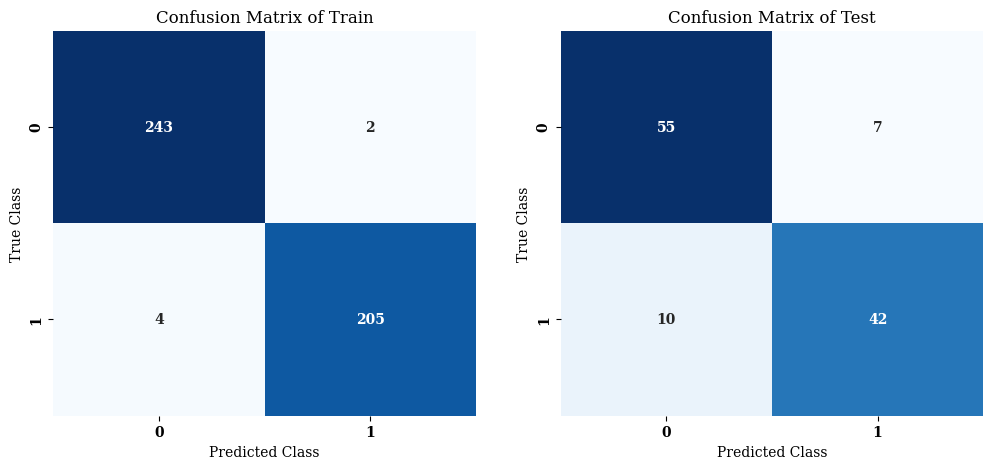

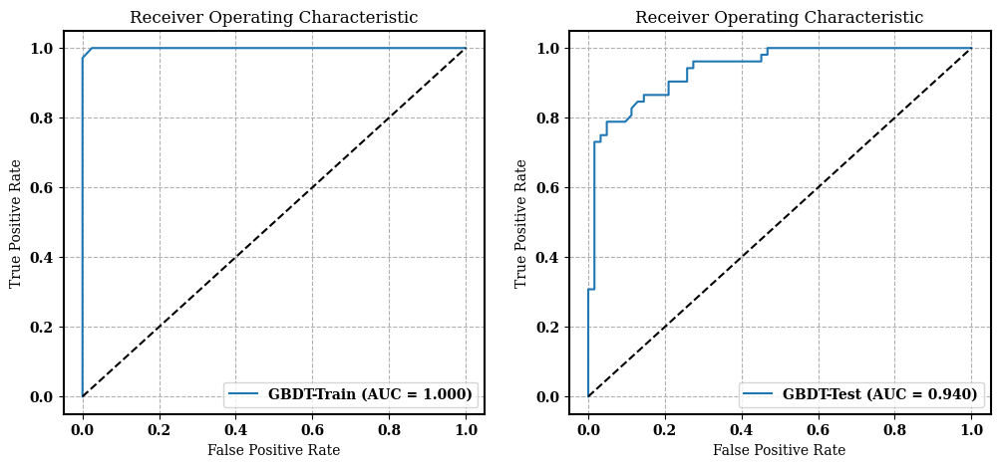

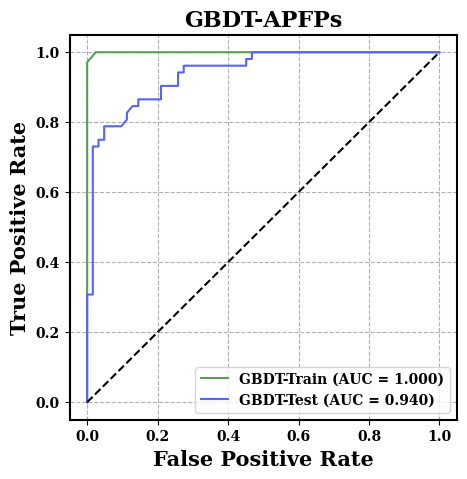

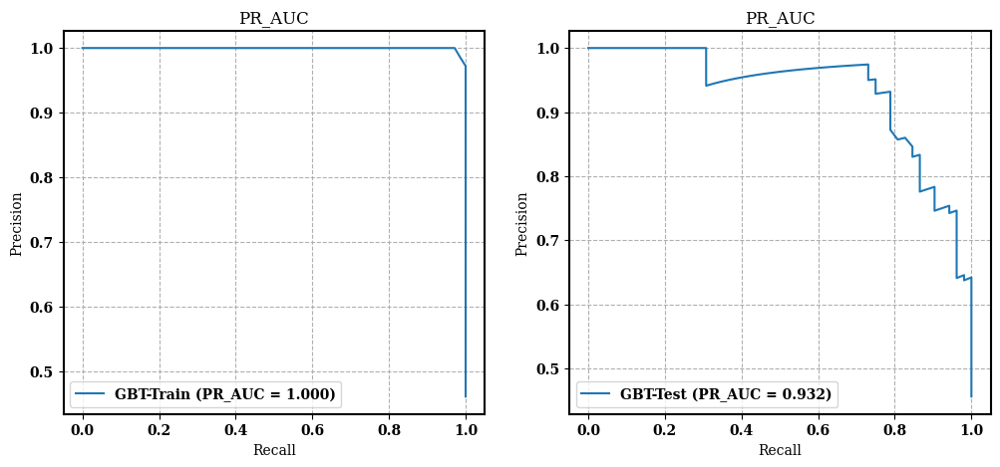

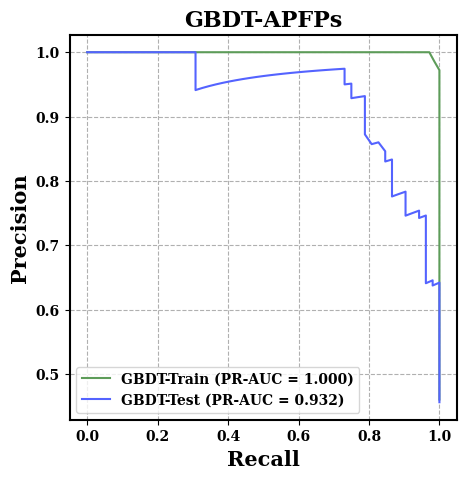

In [15]:
train_X = x_mor_train
train_Y = y_mor_train
test_X = x_mor_test
test_Y = y_mor_test
from sklearn.ensemble import GradientBoostingClassifier
GBT = GradientBoostingClassifier(random_state = 0,
                            criterion = 'squared_error',
                            max_depth = 12,
                            max_features = 'sqrt',
                            min_samples_leaf = 7,
                            min_samples_split = 20,
                            n_estimators = 54)

estimator = GBT
estimator.fit(train_X, train_Y)
clf_train = estimator.predict(train_X)
clf_test = estimator.predict(test_X)
print(f"训练集准确度是{accuracy_score(train_Y,clf_train)}")
print(f"测试集准确度是{accuracy_score(test_Y,clf_test)}")
train_matrix = confusion_matrix(train_Y, clf_train)
test_matrix = confusion_matrix(test_Y, clf_test)

# 绘制混淆矩阵
plt.rc('axes', linewidth=1.5)  # 设置边框宽度
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(train_matrix, annot=True, cmap="Blues", cbar=None,fmt="d")  
#cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Train")
plt.subplot(1, 2, 2)
sns.heatmap(test_matrix, annot=True, cmap="Blues", cbar=None,fmt="d")  
#cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Test")
plt.savefig("./GBDT/混淆矩阵_GBT.svg", dpi = 600)
plt.show()

#########  ROC
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(12, 5))
# 绘制训练集 ROC 图
plt.subplot(1, 2, 1)
plt.rc('axes', linewidth=1.5) 
y_pro_train = estimator.predict_proba(train_X)[:, 1]  # 获取训练集的预测概率
fpr_train, tpr_train, _ = roc_curve(train_Y, y_pro_train)  # 计算 ROC 曲线的参数
roc_auc_train = auc(fpr_train, tpr_train)  # 计算 AUC
plt.plot(fpr_train, tpr_train, label='GBDT-Train (AUC = %0.3f)' % roc_auc_train)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
# 绘制测试集 ROC 图
plt.subplot(1, 2, 2)
plt.rc('axes', linewidth=1.5) 
y_pro_test = estimator.predict_proba(test_X)[:, 1]  # 获取测试集的预测概率
fpr_test, tpr_test, _ = roc_curve(test_Y, y_pro_test)  # 计算 ROC 曲线的参数
roc_auc_test = auc(fpr_test, tpr_test)  # 计算 AUC
plt.plot(fpr_test, tpr_test, label='GBDT-Test (AUC = %0.3f)' % roc_auc_test)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
plt.savefig("./GBDT/ROC_GBT.svg", dpi=600)  # 保存图形为 SVG 格式文件
plt.show()  # 显示图形

##绘制组合图
plt.figure(figsize=(5, 5))
plt.rc('axes', linewidth=1.5) 
# 绘制 ROC 曲线
plt.plot(fpr_train, tpr_train,color='#5D9C59', label='GBDT-Train (AUC = %0.3f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test,color='#5463FF', label='GBDT-Test (AUC = %0.3f)' % roc_auc_test)
# 绘制对角线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色
# 添加背景网格
plt.grid(True, linestyle='--')
# 设置标题和标签
plt.title('GBDT-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('False Positive Rate', fontweight='bold', fontsize=15)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize=15)
plt.legend(loc='lower right')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./GBDT/ROC_GBT_组合.svg", dpi=600)
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score, auc
import matplotlib.pyplot as plt
# 训练集PR_AUC图
plt.figure(figsize=(12, 5))
plt.rc('axes', linewidth=1.5) 
y_pro_train = estimator.predict_proba(train_X)[:, 1]
precision_train, recall_train, _ = precision_recall_curve(train_Y, y_pro_train, pos_label=1)
pr_auc_train = auc(recall_train, precision_train)
plt.subplot(1, 2, 1)
plt.plot(recall_train, precision_train, label='GBT-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
# 测试集PR_AUC图
plt.rc('axes', linewidth=1.5) 
y_pro_test = estimator.predict_proba(test_X)[:, 1]
precision_test, recall_test, _ = precision_recall_curve(test_Y, y_pro_test, pos_label=1)
pr_auc_test = auc(recall_test, precision_test)
plt.subplot(1, 2, 2)
plt.plot(recall_test, precision_test, label='GBT-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./GBDT/PR_GBT.svg", dpi=600)
plt.show()

plt.figure(figsize=(5, 5))
plt.rc('axes', linewidth=1.5) 
# 绘制训练集PR_AUC图
plt.plot(recall_train, precision_train,color='#5D9C59', label='GBDT-Train (PR-AUC = {:.3f})'.format(pr_auc_train))
# 绘制测试集PR_AUC图
plt.plot(recall_test, precision_test,color='#5463FF', label='GBDT-Test (PR-AUC = {:.3f})'.format(pr_auc_test))
plt.title('GBDT-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('Recall', fontweight='bold', fontsize=15)
plt.ylabel('Precision', fontweight='bold', fontsize=15)
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./GBDT/PR_GBT_组合.svg", dpi=600)
plt.show()

### 交叉验证 测试集 

In [16]:
# 导入机器学习库scikit-learn中的GBT分类器和其他必要的工具包
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    roc_auc_score, f1_score, matthews_corrcoef, 
    make_scorer, confusion_matrix
)
import pandas as pd  # 导入数据处理库pandas
import numpy as np  # 导入数值计算库numpy

# 定义特异性评分函数
def specificity_score(y_true, y_pred):
    """计算特异性（Specificity）."""
    tn, fp, _, _ = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp) if (tn + fp) != 0 else 0

# 定义一个函数用于保存训练集交叉验证的分数到CSV文件，并且打印/保存平均值。
def save_cv_scores(scores, column_names, file_path, label):
    """将交叉验证的成绩保存到CSV文件中。"""
    data = pd.DataFrame(np.array(scores).reshape(1, -1), index=[label], columns=column_names)
    data['average'] = data.mean(axis=1)  # 计算平均分并添加为新列
    data.to_csv(file_path, index=False)  # 将DataFrame保存为CSV文件
    print(f"Data saved to {file_path}")  # 打印保存信息
    return data

# 定义一个函数来处理所有成绩指标并使用`save_cv_scores`函数保存它们。
# 修改process_all_scores函数，添加n_splits参数以反映正确的折数。
def process_all_scores(score_dict, algorithm_name, folder, n_splits):
    """处理所有成绩指标并将其保存到CSV文件中。"""
    results = {}
    for metric, values in score_dict.items():
        file_path = f"{folder}/{n_splits}-CV-{metric.upper()}.csv"  # 使用传入的n_splits来构造文件名
        columns = [str(i+1) for i in range(len(values))]  # 创建列名列表
        results[metric] = save_cv_scores(values, columns, file_path, algorithm_name)  # 保存成绩并添加到结果字典
    return results

# 定义梯度提升树模型，设置好超参数
GBDT = GradientBoostingClassifier(random_state = 0,
                            criterion = 'squared_error',
                            max_depth = 12,
                            max_features = 'sqrt',
                            min_samples_leaf = 7,
                            min_samples_split = 20,
                            n_estimators = 54)

# 使用GBT分类器进行训练和预测。
def train_and_evaluate(model, train_features, train_labels, test_features, test_labels):
    """训练模型并评估其在训练集和测试集上的性能。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    # 打印训练集和测试集的准确率
    print(f"Training Set Accuracy: {accuracy_score(train_labels, clf_train_preds)}")
    print(f"Test Set Accuracy: {accuracy_score(test_labels, clf_test_preds)}")

# 初始化用于训练和测试的特征和标签变量。
train_X, train_Y = x_mor_train, y_mor_train  # 训练集特征和标签
test_X, test_Y = x_mor_test, y_mor_test  # 测试集特征和标签

# 执行训练和评估。
train_and_evaluate(GBDT, train_X, train_Y, test_X, test_Y)

# 定义一个函数进行交叉验证和成绩的保存。
# 修改perform_cross_validation函数的调用，传入n_splits参数。
def perform_cross_validation(model, train_features, train_labels, n_splits, folder):
    """执行交叉验证和成绩处理。"""
    cv_strategy = StratifiedKFold(n_splits=n_splits)  # 使用分层k折交叉验证
    # 定义评分方法
    scoring_methods = {
        'accuracy': 'accuracy',
        'precision': make_scorer(precision_score, average='macro'),
        'recall': make_scorer(recall_score, average='macro'),
        'roc_auc': 'roc_auc_ovr',
        'f1': make_scorer(f1_score, average='macro'),
        'matthews_corrcoef': make_scorer(matthews_corrcoef),
        'specificity': make_scorer(specificity_score)  # 添加特异性评分
    }
    # 执行交叉验证
    scores = cross_validate(model, train_features, train_labels, scoring=scoring_methods, cv=cv_strategy)
    # 格式化分数并返回结果
    formatted_scores = {key.split('_')[-1]: scores[key] for key in scores if key.startswith('test_')}
    # 注意这里传入n_splits
    return process_all_scores(formatted_scores, model.__class__.__name__, folder, n_splits)

# 执行5折交叉验证然后是10折交叉验证。
# 注意这里传入n_splits参数到process_all_scores函数。
results_5_fold = perform_cross_validation(GBDT, train_X, train_Y, 5, "./GBDT")  # 5折交叉验证结果
results_10_fold = perform_cross_validation(GBDT, train_X, train_Y, 10, "./GBDT")  # 10折交叉验证结果

Training Set Accuracy: 0.986784140969163
Test Set Accuracy: 0.8508771929824561
Data saved to ./GBDT/5-CV-ACCURACY.csv
Data saved to ./GBDT/5-CV-PRECISION.csv
Data saved to ./GBDT/5-CV-RECALL.csv
Data saved to ./GBDT/5-CV-AUC.csv
Data saved to ./GBDT/5-CV-F1.csv
Data saved to ./GBDT/5-CV-CORRCOEF.csv
Data saved to ./GBDT/5-CV-SPECIFICITY.csv
Data saved to ./GBDT/10-CV-ACCURACY.csv
Data saved to ./GBDT/10-CV-PRECISION.csv
Data saved to ./GBDT/10-CV-RECALL.csv
Data saved to ./GBDT/10-CV-AUC.csv
Data saved to ./GBDT/10-CV-F1.csv
Data saved to ./GBDT/10-CV-CORRCOEF.csv
Data saved to ./GBDT/10-CV-SPECIFICITY.csv


In [17]:
import pandas as pd

def train_and_evaluate(model, train_features, train_labels, test_features, test_labels, output_file):
    """训练模型并评估其在训练集和测试集上的性能，包括多种评估指标，并将结果保存到CSV文件。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    
    # 计算训练集上的性能指标
    metrics = {
        'Train_Accuracy': accuracy_score(train_labels, clf_train_preds),
        'Train_Precision': precision_score(train_labels, clf_train_preds, average='macro'),
        'Train_Recall': recall_score(train_labels, clf_train_preds, average='macro'),
        'Train_F1': f1_score(train_labels, clf_train_preds, average='macro'),
        'Train_MCC': matthews_corrcoef(train_labels, clf_train_preds),
        'Train_Specificity': specificity_score(train_labels, clf_train_preds),
        'Train_ROC_AUC': roc_auc_score(train_labels, model.predict_proba(train_features)[:, 1], multi_class='ovr'),
        
        'Test_Accuracy': accuracy_score(test_labels, clf_test_preds),
        'Test_Precision': precision_score(test_labels, clf_test_preds, average='macro'),
        'Test_Recall': recall_score(test_labels, clf_test_preds, average='macro'),
        'Test_F1': f1_score(test_labels, clf_test_preds, average='macro'),
        'Test_MCC': matthews_corrcoef(test_labels, clf_test_preds),
        'Test_Specificity': specificity_score(test_labels, clf_test_preds),
        'Test_ROC_AUC': roc_auc_score(test_labels, model.predict_proba(test_features)[:, 1], multi_class='ovr')
    }
    
    # 将字典转换为DataFrame并保存到CSV文件
    df = pd.DataFrame([metrics])
    df.to_csv(output_file, index=False)
    print(f"Metrics saved to {output_file}")

# 执行训练和评估，输出结果
train_and_evaluate(GBDT, train_X, train_Y, test_X, test_Y,"./GBDT/训练和评估.csv")

Metrics saved to ./GBDT/训练和评估.csv


# LogisticRegression参数搜索

In [18]:
from sklearn.linear_model import LogisticRegressionCV

def LogisticRegressionCV_mdoel (X,Y):
    LogisticRegressionCV_auto = LogisticRegressionCV(random_state=0,n_jobs=-1)
    
    # 搜索的参数是para
    param_dict = {"solver":['newton-cg','lbfgs', 'sag', 'saga'],
                  "penalty":['l1','l2', 'elasticnet',],
                  "class_weight":['none','balanced'],
                  "fit_intercept":[True,False],
                  "dual":[True,False],
                 }
    estimator = GridSearchCV(estimator = LogisticRegressionCV_auto, param_grid=param_dict, cv=cv,n_jobs=-1,scoring = "roc_auc")
    estimator.fit(X,Y)
    
    return estimator.best_params_,estimator.best_score_,estimator.best_estimator_

tmp_1,tmp_2,LogisticRegressionCV_auto  = LogisticRegressionCV_mdoel(X,Y)
print(tmp_1,tmp_2,LogisticRegressionCV_auto)

/home/md06/.local/lib/python3.8/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for 

{'class_weight': 'balanced', 'dual': False, 'fit_intercept': False, 'penalty': 'l2', 'solver': 'sag'} 0.9260352224513501 LogisticRegressionCV(class_weight='balanced', fit_intercept=False, n_jobs=-1,
                     random_state=0, solver='sag')


In [19]:
print(tmp_1,tmp_2,LogisticRegressionCV_auto)

{'class_weight': 'balanced', 'dual': False, 'fit_intercept': False, 'penalty': 'l2', 'solver': 'sag'} 0.9260352224513501 LogisticRegressionCV(class_weight='balanced', fit_intercept=False, n_jobs=-1,
                     random_state=0, solver='sag')


### 混淆矩阵  AUC-ROC   PR-AUC

训练集准确度是0.986784140969163
测试集准确度是0.8245614035087719


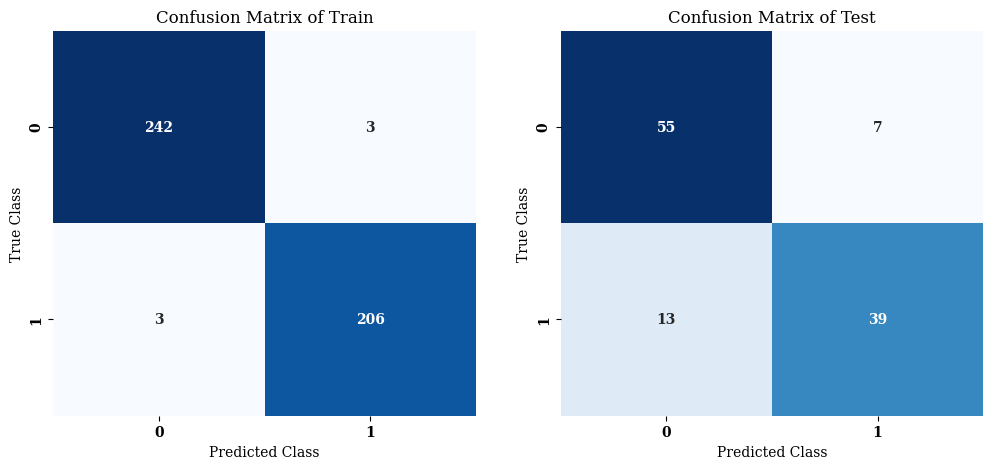

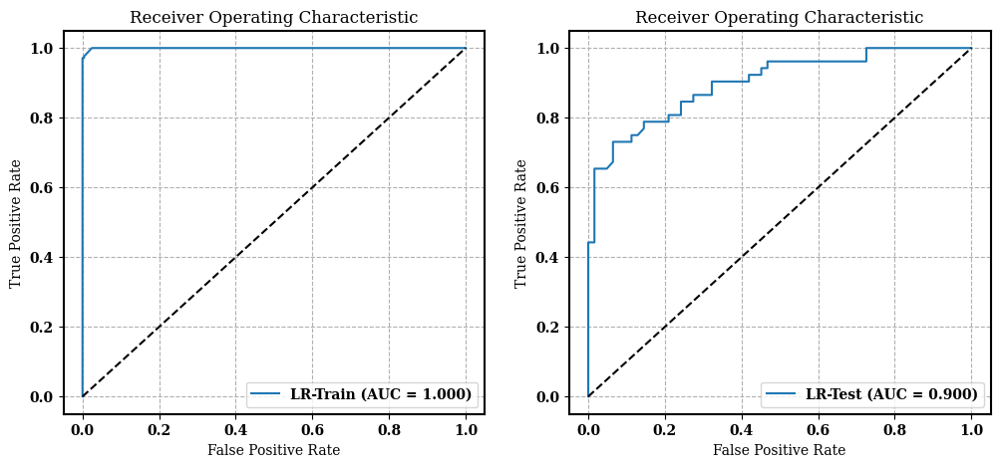

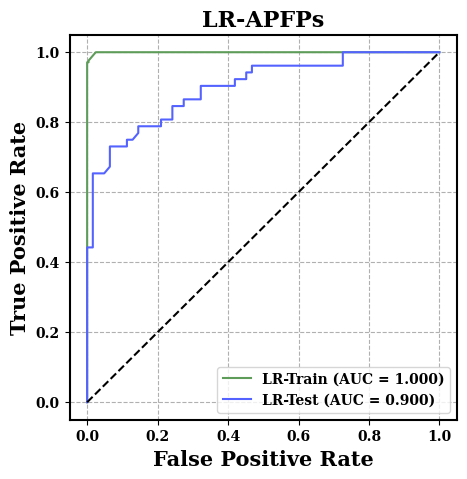

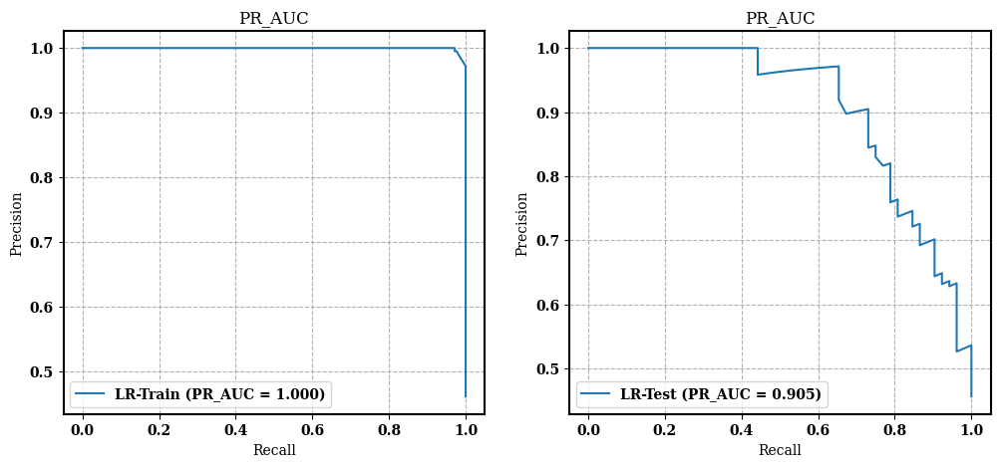

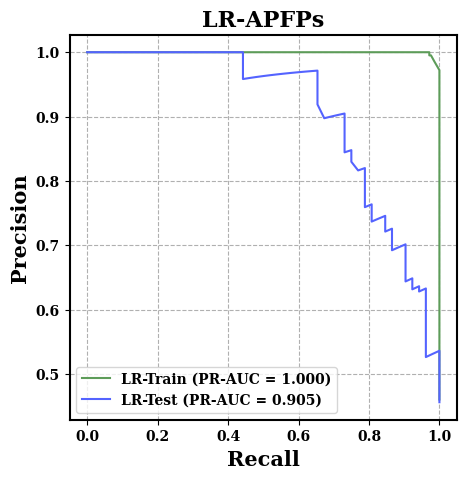

In [20]:
train_X = x_mor_train
train_Y = y_mor_train
test_X = x_mor_test
test_Y = y_mor_test
from sklearn.linear_model import LogisticRegressionCV
LR = LogisticRegressionCV(random_state=0,n_jobs=-1,
                            solver = 'sag',
                            penalty = 'l2',
                            class_weight = 'balanced',
                            fit_intercept = False,
                            dual = False
                         )

estimator = LR
estimator.fit(train_X, train_Y)
clf_train = estimator.predict(train_X)
clf_test = estimator.predict(test_X)
print(f"训练集准确度是{accuracy_score(train_Y,clf_train)}")
print(f"测试集准确度是{accuracy_score(test_Y,clf_test)}")
train_matrix = confusion_matrix(train_Y, clf_train)
test_matrix = confusion_matrix(test_Y, clf_test)

# 绘制热图
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(train_matrix, annot=True, cmap="Blues", cbar=None,
            fmt="d")  #cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Train")
plt.subplot(1, 2, 2)
sns.heatmap(test_matrix, annot=True, cmap="Blues", cbar=None,
            fmt="d")  #cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Test")
plt.savefig("./LR/混淆矩阵_LR.svg", dpi = 600)
plt.show()

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(12, 5))

# 绘制训练集 ROC 图
plt.subplot(1, 2, 1)
y_pro_train = estimator.predict_proba(train_X)[:, 1]  # 获取训练集的预测概率
fpr_train, tpr_train, _ = roc_curve(train_Y, y_pro_train)  # 计算 ROC 曲线的参数
roc_auc_train = auc(fpr_train, tpr_train)  # 计算 AUC
plt.plot(fpr_train, tpr_train, label='LR-Train (AUC = %0.3f)' % roc_auc_train)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
# 绘制测试集 ROC 图
plt.subplot(1, 2, 2)
y_pro_test = estimator.predict_proba(test_X)[:, 1]  # 获取测试集的预测概率
fpr_test, tpr_test, _ = roc_curve(test_Y, y_pro_test)  # 计算 ROC 曲线的参数
roc_auc_test = auc(fpr_test, tpr_test)  # 计算 AUC
plt.plot(fpr_test, tpr_test, label='LR-Test (AUC = %0.3f)' % roc_auc_test)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
plt.savefig("./LR/ROC_LR.svg", dpi=600)  # 保存图形为 SVG 格式文件
plt.show()  # 显示图形

##绘制组合图
plt.figure(figsize=(5, 5))
# 绘制 ROC 曲线
plt.plot(fpr_train, tpr_train, color='#5D9C59',label='LR-Train (AUC = %0.3f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test, color='#5463FF',label='LR-Test (AUC = %0.3f)' % roc_auc_test)
# 绘制对角线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色
# 添加背景网格
plt.grid(True, linestyle='--')
# 设置标题和标签
plt.title('LR-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('False Positive Rate', fontweight='bold', fontsize=15)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize=15)
plt.legend(loc='lower right')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./LR/ROC_LR_组合.svg", dpi=600)
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score, auc
import matplotlib.pyplot as plt

# 训练集PR_AUC图
plt.figure(figsize=(12, 5))
y_pro_train = estimator.predict_proba(train_X)[:, 1]
precision_train, recall_train, _ = precision_recall_curve(train_Y, y_pro_train, pos_label=1)
pr_auc_train = auc(recall_train, precision_train)
plt.subplot(1, 2, 1)
plt.plot(recall_train, precision_train, label='LR-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
# 测试集PR_AUC图
y_pro_test = estimator.predict_proba(test_X)[:, 1]
precision_test, recall_test, _ = precision_recall_curve(test_Y, y_pro_test, pos_label=1)
pr_auc_test = auc(recall_test, precision_test)
plt.subplot(1, 2, 2)
plt.plot(recall_test, precision_test, label='LR-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./LR/PR_LR.svg", dpi=600)
plt.show()

plt.figure(figsize=(5, 5))
# 绘制训练集PR_AUC图
plt.plot(recall_train, precision_train,color='#5D9C59', label='LR-Train (PR-AUC = {:.3f})'.format(pr_auc_train))
# 绘制测试集PR_AUC图
plt.plot(recall_test, precision_test,color='#5463FF', label='LR-Test (PR-AUC = {:.3f})'.format(pr_auc_test))
plt.title('LR-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('Recall', fontweight='bold', fontsize=15)
plt.ylabel('Precision', fontweight='bold', fontsize=15)
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./LR/PR_LR_组合.svg", dpi=600)
plt.show()

### 交叉验证 测试集

In [21]:
# 忽略特定类型的警告
warnings.filterwarnings("ignore", category=DataConversionWarning)

# 导入机器学习库scikit-learn中的LR分类器和其他必要的工具包
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    roc_auc_score, f1_score, matthews_corrcoef, 
    make_scorer, confusion_matrix
)
import pandas as pd  # 导入数据处理库pandas
import numpy as np  # 导入数值计算库numpy

# 定义特异性评分函数
def specificity_score(y_true, y_pred):
    """计算特异性（Specificity）."""
    tn, fp, _, _ = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp) if (tn + fp) != 0 else 0

# 定义一个函数用于保存训练集交叉验证的分数到CSV文件，并且打印/保存平均值。
def save_cv_scores(scores, column_names, file_path, label):
    """将交叉验证的成绩保存到CSV文件中。"""
    data = pd.DataFrame(np.array(scores).reshape(1, -1), index=[label], columns=column_names)
    data['average'] = data.mean(axis=1)  # 计算平均分并添加为新列
    data.to_csv(file_path, index=False)  # 将DataFrame保存为CSV文件
    print(f"Data saved to {file_path}")  # 打印保存信息
    return data

# 定义一个函数来处理所有成绩指标并使用`save_cv_scores`函数保存它们。
# 修改process_all_scores函数，添加n_splits参数以反映正确的折数。
def process_all_scores(score_dict, algorithm_name, folder, n_splits):
    """处理所有成绩指标并将其保存到CSV文件中。"""
    results = {}
    for metric, values in score_dict.items():
        file_path = f"{folder}/{n_splits}-CV-{metric.upper()}.csv"  # 使用传入的n_splits来构造文件名
        columns = [str(i+1) for i in range(len(values))]  # 创建列名列表
        results[metric] = save_cv_scores(values, columns, file_path, algorithm_name)  # 保存成绩并添加到结果字典
    return results

# 初始化和训练逻辑回归模型
LR = LogisticRegressionCV(random_state=0,n_jobs=-1,
                            solver = 'sag',
                            penalty = 'l2',
                            class_weight = 'balanced',
                            fit_intercept = False,
                            dual = False
                         )

# 使用LR分类器进行训练和预测。
def train_and_evaluate(model, train_features, train_labels, test_features, test_labels):
    """训练模型并评估其在训练集和测试集上的性能。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    # 打印训练集和测试集的准确率
    print(f"Training Set Accuracy: {accuracy_score(train_labels, clf_train_preds)}")
    print(f"Test Set Accuracy: {accuracy_score(test_labels, clf_test_preds)}")

# 初始化用于训练和测试的特征和标签变量。
train_X, train_Y = x_mor_train, y_mor_train  # 训练集特征和标签
test_X, test_Y = x_mor_test, y_mor_test  # 测试集特征和标签

# 执行训练和评估。
train_and_evaluate(LR, train_X, train_Y, test_X, test_Y)

# 定义一个函数进行交叉验证和成绩的保存。
# 修改perform_cross_validation函数的调用，传入n_splits参数。
def perform_cross_validation(model, train_features, train_labels, n_splits, folder):
    """执行交叉验证和成绩处理。"""
    cv_strategy = StratifiedKFold(n_splits=n_splits)  # 使用分层k折交叉验证
    # 定义评分方法
    scoring_methods = {
        'accuracy': 'accuracy',
        'precision': make_scorer(precision_score, average='macro'),
        'recall': make_scorer(recall_score, average='macro'),
        'roc_auc': 'roc_auc_ovr',
        'f1': make_scorer(f1_score, average='macro'),
        'matthews_corrcoef': make_scorer(matthews_corrcoef),
        'specificity': make_scorer(specificity_score)  # 添加特异性评分
    }
    # 执行交叉验证
    scores = cross_validate(model, train_features, train_labels, scoring=scoring_methods, cv=cv_strategy)
    # 格式化分数并返回结果
    formatted_scores = {key.split('_')[-1]: scores[key] for key in scores if key.startswith('test_')}
    # 注意这里传入n_splits
    return process_all_scores(formatted_scores, model.__class__.__name__, folder, n_splits)

# 执行5折交叉验证然后是10折交叉验证。
# 注意这里传入n_splits参数到process_all_scores函数。
results_5_fold = perform_cross_validation(LR, train_X, train_Y, 5, "./LR")  # 5折交叉验证结果
results_10_fold = perform_cross_validation(LR, train_X, train_Y, 10, "./LR")  # 10折交叉验证结果

Training Set Accuracy: 0.986784140969163
Test Set Accuracy: 0.8245614035087719
Data saved to ./LR/5-CV-ACCURACY.csv
Data saved to ./LR/5-CV-PRECISION.csv
Data saved to ./LR/5-CV-RECALL.csv
Data saved to ./LR/5-CV-AUC.csv
Data saved to ./LR/5-CV-F1.csv
Data saved to ./LR/5-CV-CORRCOEF.csv
Data saved to ./LR/5-CV-SPECIFICITY.csv
Data saved to ./LR/10-CV-ACCURACY.csv
Data saved to ./LR/10-CV-PRECISION.csv
Data saved to ./LR/10-CV-RECALL.csv
Data saved to ./LR/10-CV-AUC.csv
Data saved to ./LR/10-CV-F1.csv
Data saved to ./LR/10-CV-CORRCOEF.csv
Data saved to ./LR/10-CV-SPECIFICITY.csv


In [22]:
import pandas as pd

def train_and_evaluate(model, train_features, train_labels, test_features, test_labels, output_file):
    """训练模型并评估其在训练集和测试集上的性能，包括多种评估指标，并将结果保存到CSV文件。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    
    # 计算训练集上的性能指标
    metrics = {
        'Train_Accuracy': accuracy_score(train_labels, clf_train_preds),
        'Train_Precision': precision_score(train_labels, clf_train_preds, average='macro'),
        'Train_Recall': recall_score(train_labels, clf_train_preds, average='macro'),
        'Train_F1': f1_score(train_labels, clf_train_preds, average='macro'),
        'Train_MCC': matthews_corrcoef(train_labels, clf_train_preds),
        'Train_Specificity': specificity_score(train_labels, clf_train_preds),
        'Train_ROC_AUC': roc_auc_score(train_labels, model.predict_proba(train_features)[:, 1], multi_class='ovr'),
        
        'Test_Accuracy': accuracy_score(test_labels, clf_test_preds),
        'Test_Precision': precision_score(test_labels, clf_test_preds, average='macro'),
        'Test_Recall': recall_score(test_labels, clf_test_preds, average='macro'),
        'Test_F1': f1_score(test_labels, clf_test_preds, average='macro'),
        'Test_MCC': matthews_corrcoef(test_labels, clf_test_preds),
        'Test_Specificity': specificity_score(test_labels, clf_test_preds),
        'Test_ROC_AUC': roc_auc_score(test_labels, model.predict_proba(test_features)[:, 1], multi_class='ovr')
    }
    
    # 将字典转换为DataFrame并保存到CSV文件
    df = pd.DataFrame([metrics])
    df.to_csv(output_file, index=False)
    print(f"Metrics saved to {output_file}")

# 执行训练和评估，输出结果
train_and_evaluate(LR, train_X, train_Y, test_X, test_Y,"./LR/训练和评估.csv")

Metrics saved to ./LR/训练和评估.csv


# KNeighbors参数搜索

In [28]:
from sklearn.neighbors import KNeighborsClassifier
from time import time
begin_time = time()
# Search optimal hyperparameter
KNeighborsClassifier_auto = KNeighborsClassifier(n_jobs=1)

random_forest_hp_range={"n_neighbors":[2,3,4,5,6,7,8,9,10,11,12,13,14,15],
                 "algorithm":['auto', 'ball_tree', 'kd_tree', 'brute'],
                  "weights":['uniform', 'distance'],
                  "p":[1, 2],
                       }
print(random_forest_hp_range)

estimator_all_roc = GridSearchCV(estimator=KNeighborsClassifier_auto,
                                 param_grid=random_forest_hp_range,
                                 cv=cv,
                                 n_jobs=-1,
                                 scoring="roc_auc",verbose=1)
# %%time
estimator_all_roc.fit(X, Y)
end_time = time()
print({end_time - begin_time})
print(estimator_all_roc.best_params_)
print(estimator_all_roc.best_score_)
tmp = pd.DataFrame(estimator_all_roc.cv_results_)
df_fig = tmp[["mean_test_score","params"]]
df_fig.to_csv("./KNN/tmp2-knn.csv",index=False)
df_fig["n_neighbors"] = 1
df_fig['algorithm'] = 1
df_fig["weights"] = 1
df_fig['p']=1
for i in range(0,df_fig.shape[0]):
    dict_tmp = df_fig["params"].iloc[i]
    df_fig["n_neighbors"].iloc[i] = dict_tmp["n_neighbors"]
    df_fig["algorithm"].iloc[i] = dict_tmp["algorithm"]
    df_fig["weights"].iloc[i] = dict_tmp["weights"]
    df_fig['p'].iloc[i]=dict_tmp['p']
    
df_fig.head(50)
df_fig.to_csv("./KNN/网格搜索结果KNN.csv",index=False)
df_fig.describe()

{'n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], 'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'], 'weights': ['uniform', 'distance'], 'p': [1, 2]}
Fitting 5 folds for each of 224 candidates, totalling 1120 fits


/home/md06/.local/lib/python3.8/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/md06/.local/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/md06/.local/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The m

{4.131703615188599}
{'algorithm': 'auto', 'n_neighbors': 6, 'p': 1, 'weights': 'uniform'}
0.9170079878641351


,mean_test_score,n_neighbors,p
count,224.000000,224.000000,224.00000
mean,0.901722,8.500000,1.50000
std,0.009186,4.040157,0.50112
min,0.876059,2.000000,1.00000
25%,0.899430,5.000000,1.00000
50%,0.903771,8.500000,1.50000
75%,0.906441,12.000000,2.00000
max,0.917008,15.000000,2.00000


In [29]:
print(estimator_all_roc.best_params_)

{'algorithm': 'auto', 'n_neighbors': 6, 'p': 1, 'weights': 'uniform'}


训练集准确度是0.8964757709251101
测试集准确度是0.8596491228070176


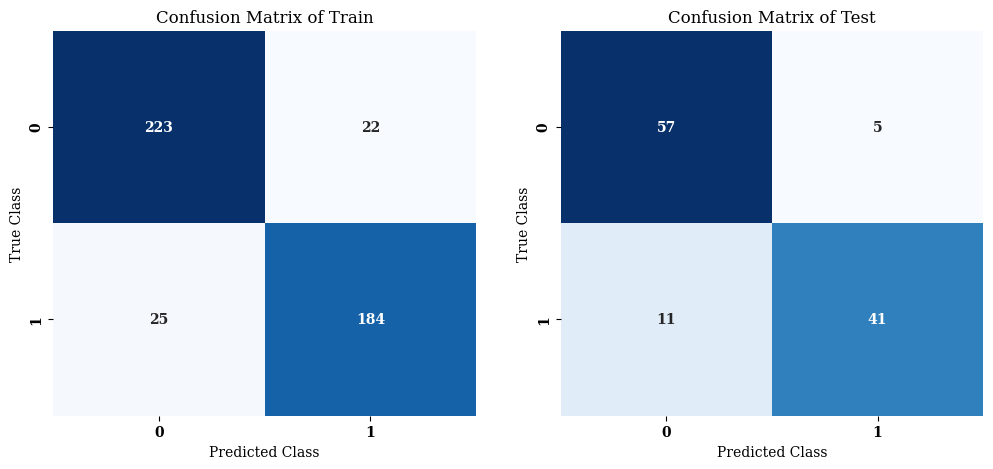

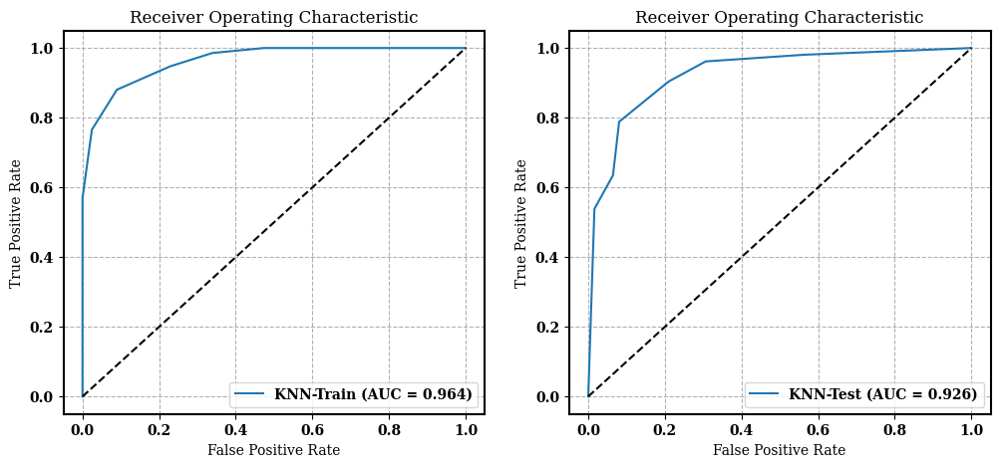

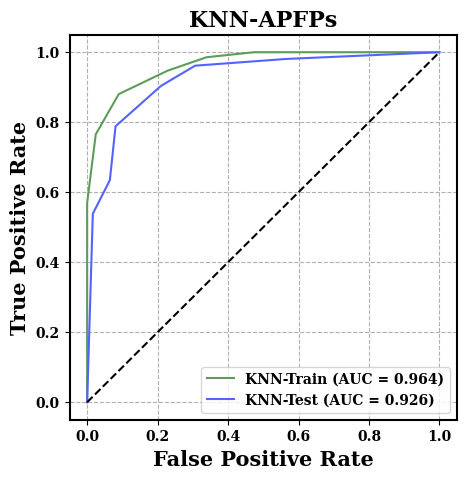

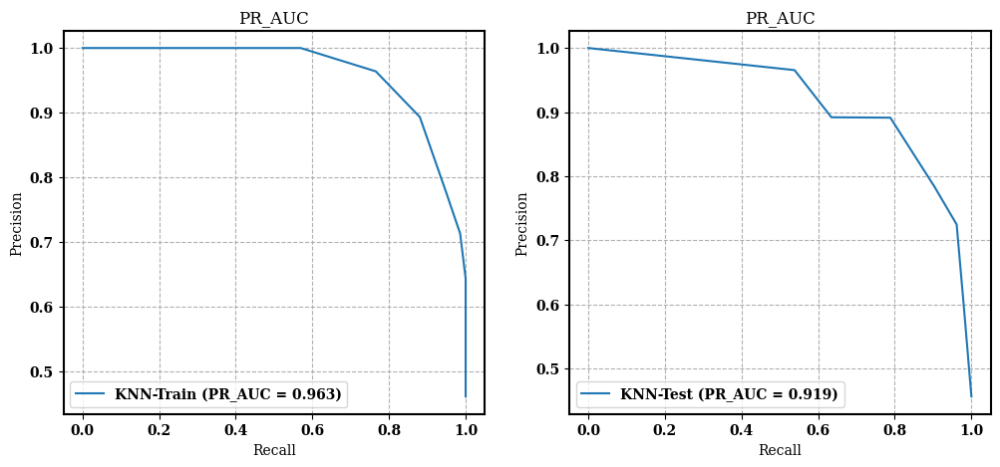

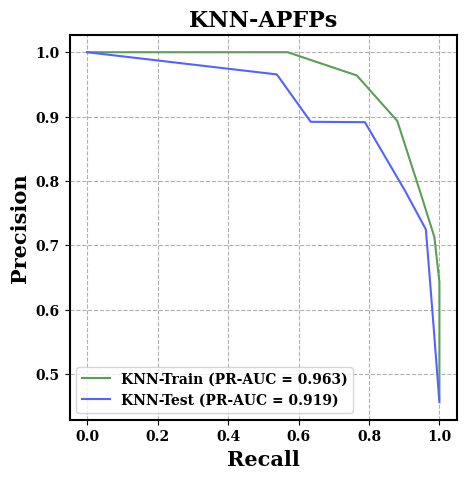

In [30]:
train_X = x_mor_train
train_Y = y_mor_train
test_X = x_mor_test
test_Y = y_mor_test
from sklearn.neighbors import KNeighborsClassifier
KNN = KNeighborsClassifier(n_jobs=-1,
                            algorithm = 'auto',
                            n_neighbors = 6,
                            p = 1,
                            weights = 'uniform'
                         )

estimator = KNN
estimator.fit(train_X, train_Y)
clf_train = estimator.predict(train_X)
clf_test = estimator.predict(test_X)
print(f"训练集准确度是{accuracy_score(train_Y,clf_train)}")
print(f"测试集准确度是{accuracy_score(test_Y,clf_test)}")

train_matrix = confusion_matrix(train_Y, clf_train)
test_matrix = confusion_matrix(test_Y, clf_test)

# 绘制混淆矩阵
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(train_matrix, annot=True, cmap="Blues", cbar=None,fmt="d")  
#cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Train")
plt.subplot(1, 2, 2)
sns.heatmap(test_matrix, annot=True, cmap="Blues", cbar=None,fmt="d")  
#cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Test")
plt.savefig("./KNN/混淆矩阵_KNN.svg", dpi = 600)
plt.show()

#########  ROC
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(12, 5))
# 训练集 ROC 图
plt.subplot(1, 2, 1)
y_pro_train = estimator.predict_proba(train_X)[:, 1]  # 获取训练集的预测概率
fpr_train, tpr_train, _ = roc_curve(train_Y, y_pro_train)  # 计算 ROC 曲线的参数
roc_auc_train = auc(fpr_train, tpr_train)  # 计算 AUC
plt.plot(fpr_train, tpr_train, label='KNN-Train (AUC = %0.3f)' % roc_auc_train)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
# 绘制测试集 ROC 图
plt.subplot(1, 2, 2)
y_pro_test = estimator.predict_proba(test_X)[:, 1]  # 获取测试集的预测概率
fpr_test, tpr_test, _ = roc_curve(test_Y, y_pro_test)  # 计算 ROC 曲线的参数
roc_auc_test = auc(fpr_test, tpr_test)  # 计算 AUC
plt.plot(fpr_test, tpr_test, label='KNN-Test (AUC = %0.3f)' % roc_auc_test)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
plt.savefig("./KNN/ROC_KNN.svg", dpi=600)  # 保存图形为 SVG 格式文件
plt.show()  # 显示图形

##绘制组合图
plt.figure(figsize=(5, 5))
# 绘制 ROC 曲线
plt.plot(fpr_train, tpr_train,color='#5D9C59', label='KNN-Train (AUC = %0.3f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test,color='#5463FF', label='KNN-Test (AUC = %0.3f)' % roc_auc_test)
# 绘制对角线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色
# 添加背景网格
plt.grid(True, linestyle='--')
# 设置标题和标签
plt.title('KNN-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('False Positive Rate', fontweight='bold', fontsize=15)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize=15)
plt.legend(loc='lower right')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./KNN/ROC_KNN_组合.svg", dpi=600)
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score, auc
import matplotlib.pyplot as plt
# 训练集PR_AUC图
plt.figure(figsize=(12, 5))
y_pro_train = estimator.predict_proba(train_X)[:, 1]
precision_train, recall_train, _ = precision_recall_curve(train_Y, y_pro_train, pos_label=1)
pr_auc_train = auc(recall_train, precision_train)
plt.subplot(1, 2, 1)
plt.plot(recall_train, precision_train, label='KNN-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
# 测试集PR_AUC图
y_pro_test = estimator.predict_proba(test_X)[:, 1]
precision_test, recall_test, _ = precision_recall_curve(test_Y, y_pro_test, pos_label=1)
pr_auc_test = auc(recall_test, precision_test)
plt.subplot(1, 2, 2)
plt.plot(recall_test, precision_test, label='KNN-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./KNN/PR_KNN.svg", dpi=600)
plt.show()

plt.figure(figsize=(5, 5))
# 绘制训练集PR_AUC图
plt.plot(recall_train, precision_train,color='#5D9C59', label='KNN-Train (PR-AUC = {:.3f})'.format(pr_auc_train))
# 绘制测试集PR_AUC图
plt.plot(recall_test, precision_test,color='#5463FF', label='KNN-Test (PR-AUC = {:.3f})'.format(pr_auc_test))
plt.title('KNN-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('Recall', fontweight='bold', fontsize=15)
plt.ylabel('Precision', fontweight='bold', fontsize=15)
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./KNN/PR_KNN_组合.svg", dpi=600)
plt.show()

### 交叉验证 测试集

In [31]:
# 忽略特定类型的警告
warnings.filterwarnings("ignore", category=DataConversionWarning)

# 导入机器学习库scikit-learn中的KNN分类器和其他必要的工具包
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    roc_auc_score, f1_score, matthews_corrcoef, 
    make_scorer, confusion_matrix
)
import pandas as pd  # 导入数据处理库pandas
import numpy as np  # 导入数值计算库numpy

# 定义特异性评分函数
def specificity_score(y_true, y_pred):
    """计算特异性（Specificity）."""
    tn, fp, _, _ = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp) if (tn + fp) != 0 else 0

# 定义一个函数用于保存训练集交叉验证的分数到CSV文件，并且打印/保存平均值。
def save_cv_scores(scores, column_names, file_path, label):
    """将交叉验证的成绩保存到CSV文件中。"""
    data = pd.DataFrame(np.array(scores).reshape(1, -1), index=[label], columns=column_names)
    data['average'] = data.mean(axis=1)  # 计算平均分并添加为新列
    data.to_csv(file_path, index=False)  # 将DataFrame保存为CSV文件
    print(f"Data saved to {file_path}")  # 打印保存信息
    return data

# 定义一个函数来处理所有成绩指标并使用`save_cv_scores`函数保存它们。
# 修改process_all_scores函数，添加n_splits参数以反映正确的折数。
def process_all_scores(score_dict, algorithm_name, folder, n_splits):
    """处理所有成绩指标并将其保存到CSV文件中。"""
    results = {}
    for metric, values in score_dict.items():
        file_path = f"{folder}/{n_splits}-CV-{metric.upper()}.csv"  # 使用传入的n_splits来构造文件名
        columns = [str(i+1) for i in range(len(values))]  # 创建列名列表
        results[metric] = save_cv_scores(values, columns, file_path, algorithm_name)  # 保存成绩并添加到结果字典
    return results

# 实例化KNN分类器，配置超参数
KNN = KNeighborsClassifier(n_jobs=-1,
                            algorithm = 'auto',
                            n_neighbors = 6,
                            p = 1,
                            weights = 'uniform'
                         )
# 使用KNN分类器进行训练和预测。
def train_and_evaluate(model, train_features, train_labels, test_features, test_labels):
    """训练模型并评估其在训练集和测试集上的性能。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    # 打印训练集和测试集的准确率
    print(f"Training Set Accuracy: {accuracy_score(train_labels, clf_train_preds)}")
    print(f"Test Set Accuracy: {accuracy_score(test_labels, clf_test_preds)}")

# 初始化用于训练和测试的特征和标签变量。
train_X, train_Y = x_mor_train, y_mor_train  # 训练集特征和标签
test_X, test_Y = x_mor_test, y_mor_test  # 测试集特征和标签

# 执行训练和评估。
train_and_evaluate(KNN, train_X, train_Y, test_X, test_Y)

# 定义一个函数进行交叉验证和成绩的保存。
# 修改perform_cross_validation函数的调用，传入n_splits参数。
def perform_cross_validation(model, train_features, train_labels, n_splits, folder):
    """执行交叉验证和成绩处理。"""
    cv_strategy = StratifiedKFold(n_splits=n_splits)  # 使用分层k折交叉验证
    # 定义评分方法
    scoring_methods = {
        'accuracy': 'accuracy',
        'precision': make_scorer(precision_score, average='macro'),
        'recall': make_scorer(recall_score, average='macro'),
        'roc_auc': 'roc_auc_ovr',
        'f1': make_scorer(f1_score, average='macro'),
        'matthews_corrcoef': make_scorer(matthews_corrcoef),
        'specificity': make_scorer(specificity_score)  # 添加特异性评分
    }
    # 执行交叉验证
    scores = cross_validate(model, train_features, train_labels, scoring=scoring_methods, cv=cv_strategy)
    # 格式化分数并返回结果
    formatted_scores = {key.split('_')[-1]: scores[key] for key in scores if key.startswith('test_')}
    # 注意这里传入n_splits
    return process_all_scores(formatted_scores, model.__class__.__name__, folder, n_splits)

# 执行5折交叉验证然后是10折交叉验证。
# 注意这里传入n_splits参数到process_all_scores函数。
results_5_fold = perform_cross_validation(KNN, train_X, train_Y, 5, "./KNN")  # 5折交叉验证结果
results_10_fold = perform_cross_validation(KNN, train_X, train_Y, 10, "./KNN")  # 10折交叉验证结果

Training Set Accuracy: 0.8964757709251101
Test Set Accuracy: 0.8596491228070176
Data saved to ./KNN/5-CV-ACCURACY.csv
Data saved to ./KNN/5-CV-PRECISION.csv
Data saved to ./KNN/5-CV-RECALL.csv
Data saved to ./KNN/5-CV-AUC.csv
Data saved to ./KNN/5-CV-F1.csv
Data saved to ./KNN/5-CV-CORRCOEF.csv
Data saved to ./KNN/5-CV-SPECIFICITY.csv
Data saved to ./KNN/10-CV-ACCURACY.csv
Data saved to ./KNN/10-CV-PRECISION.csv
Data saved to ./KNN/10-CV-RECALL.csv
Data saved to ./KNN/10-CV-AUC.csv
Data saved to ./KNN/10-CV-F1.csv
Data saved to ./KNN/10-CV-CORRCOEF.csv
Data saved to ./KNN/10-CV-SPECIFICITY.csv


In [32]:
import pandas as pd

def train_and_evaluate(model, train_features, train_labels, test_features, test_labels, output_file):
    """训练模型并评估其在训练集和测试集上的性能，包括多种评估指标，并将结果保存到CSV文件。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    
    # 计算训练集上的性能指标
    metrics = {
        'Train_Accuracy': accuracy_score(train_labels, clf_train_preds),
        'Train_Precision': precision_score(train_labels, clf_train_preds, average='macro'),
        'Train_Recall': recall_score(train_labels, clf_train_preds, average='macro'),
        'Train_F1': f1_score(train_labels, clf_train_preds, average='macro'),
        'Train_MCC': matthews_corrcoef(train_labels, clf_train_preds),
        'Train_Specificity': specificity_score(train_labels, clf_train_preds),
        'Train_ROC_AUC': roc_auc_score(train_labels, model.predict_proba(train_features)[:, 1], multi_class='ovr'),
        
        'Test_Accuracy': accuracy_score(test_labels, clf_test_preds),
        'Test_Precision': precision_score(test_labels, clf_test_preds, average='macro'),
        'Test_Recall': recall_score(test_labels, clf_test_preds, average='macro'),
        'Test_F1': f1_score(test_labels, clf_test_preds, average='macro'),
        'Test_MCC': matthews_corrcoef(test_labels, clf_test_preds),
        'Test_Specificity': specificity_score(test_labels, clf_test_preds),
        'Test_ROC_AUC': roc_auc_score(test_labels, model.predict_proba(test_features)[:, 1], multi_class='ovr')
    }
    
    # 将字典转换为DataFrame并保存到CSV文件
    df = pd.DataFrame([metrics])
    df.to_csv(output_file, index=False)
    print(f"Metrics saved to {output_file}")

# 执行训练和评估，输出结果
train_and_evaluate(KNN, train_X, train_Y, test_X, test_Y,"./KNN/训练和评估.csv")

Metrics saved to ./KNN/训练和评估.csv


# SVM参数搜索

In [33]:
from sklearn.svm import SVC
from time import time
begin_time = time()
# Search optimal hyperparameter
SVC_auto = SVC(random_state=0,probability=True)

random_forest_hp_range={ "gamma":['scale','auto'],
                 'C': [0.1, 1, 10, 50,100],  
                "kernel":[ 'linear', 'rbf', 'sigmoid'],      #, 'precomputed' 这个参数对于X有额外的要求
                "shrinking":[True, False],
                "class_weight":['none','balanced'],
                       }
print(random_forest_hp_range)

estimator_all_roc = GridSearchCV(estimator=SVC_auto,
                                 param_grid=random_forest_hp_range,
                                 cv=cv,
                                 n_jobs=-1,
                                 scoring="roc_auc",verbose=1)
# %%time
estimator_all_roc.fit(X, Y)
end_time = time()
print({end_time - begin_time})
print(estimator_all_roc.best_params_)
print(estimator_all_roc.best_score_)
tmp = pd.DataFrame(estimator_all_roc.cv_results_)
df_fig = tmp[["mean_test_score","params"]]
df_fig.to_csv("./SVM/tmp2-svm.csv",index=False)
df_fig["gamma"] = 1
#df_fig["C"] = 1
df_fig['kernel'] = 1
df_fig["shrinking"] = 1
df_fig['class_weight']=1
for i in range(0,df_fig.shape[0]):
    dict_tmp = df_fig["params"].iloc[i]
    df_fig["gamma"].iloc[i] = dict_tmp["gamma"]
    #df_fig["C"].iloc[i] = dict_tmp["C"]
    df_fig["kernel"].iloc[i] = dict_tmp["kernel"]
    df_fig["shrinking"].iloc[i] = dict_tmp["shrinking"]
    df_fig['class_weight'].iloc[i]=dict_tmp['class_weight']
df_fig.head(50)
df_fig.to_csv("./SVM/网格搜索结果SVM.csv",index=False)
df_fig.describe()

{'gamma': ['scale', 'auto'], 'C': [0.1, 1, 10, 50, 100], 'kernel': ['linear', 'rbf', 'sigmoid'], 'shrinking': [True, False], 'class_weight': ['none', 'balanced']}
Fitting 5 folds for each of 120 candidates, totalling 600 fits


/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of

{6.706074237823486}
{'C': 100, 'class_weight': 'balanced', 'gamma': 'auto', 'kernel': 'sigmoid', 'shrinking': True}
0.9284742468415939


,mean_test_score
count,60.000000
mean,0.882034
std,0.063824
min,0.707649
25%,0.858992
50%,0.917512
75%,0.920373
max,0.928474


In [34]:
print(estimator_all_roc.best_params_)

{'C': 100, 'class_weight': 'balanced', 'gamma': 'auto', 'kernel': 'sigmoid', 'shrinking': True}


训练集准确度是0.9823788546255506
测试集准确度是0.8157894736842105


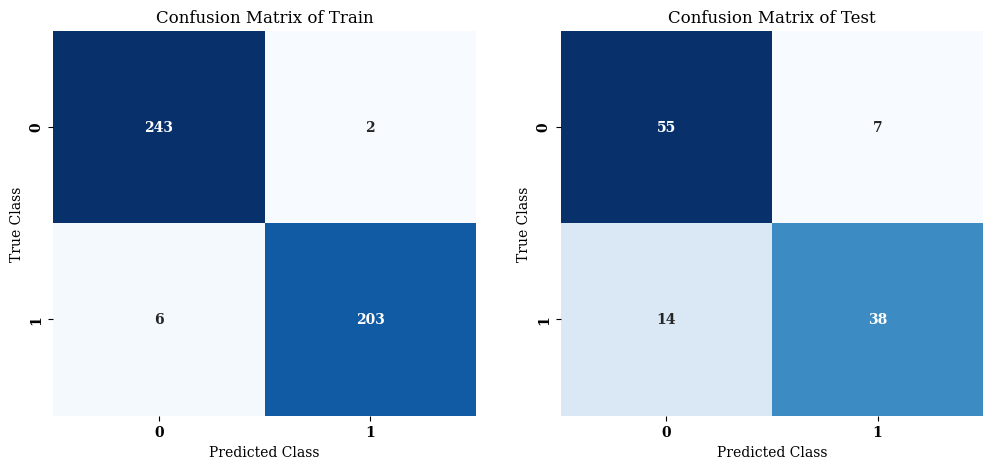

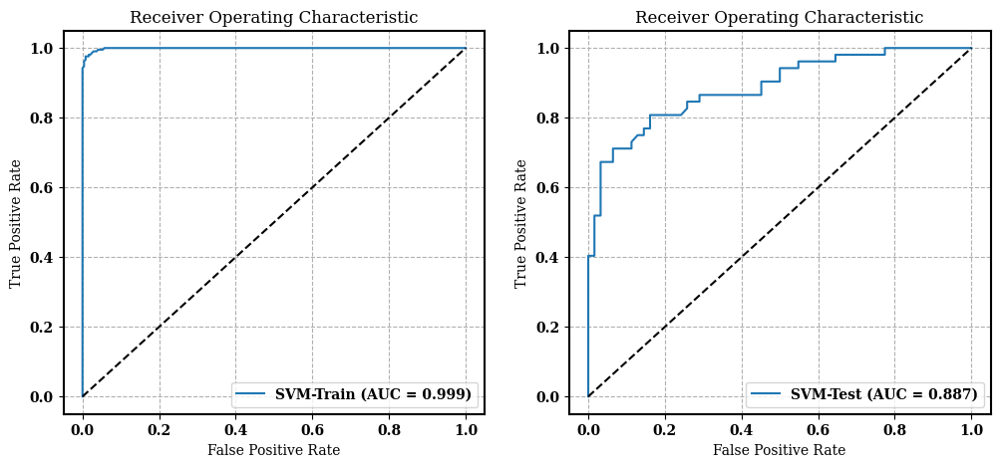

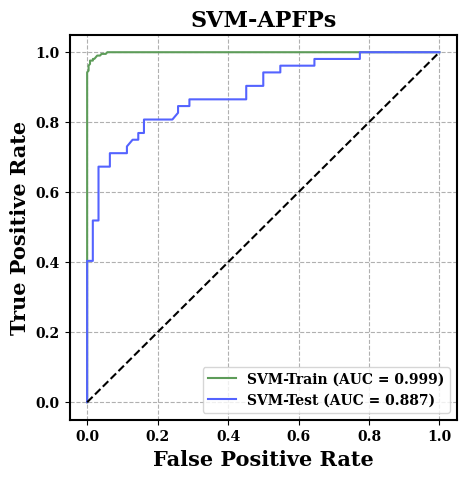

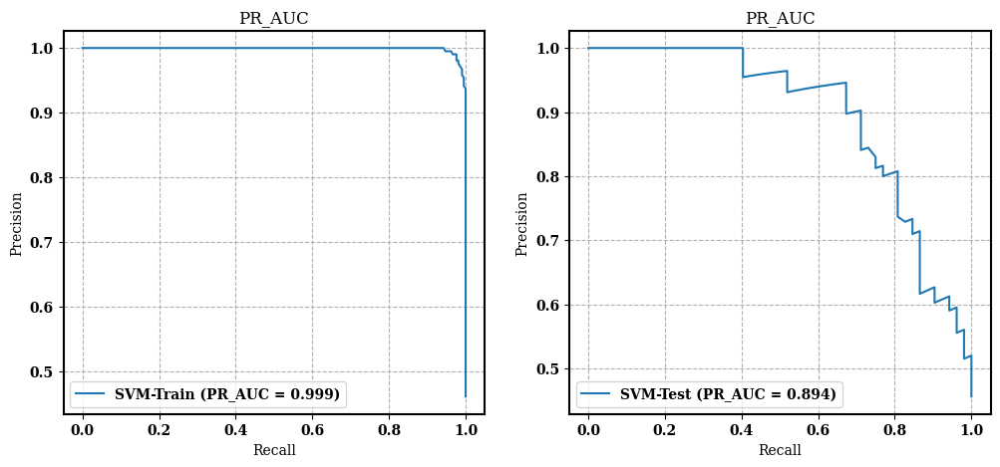

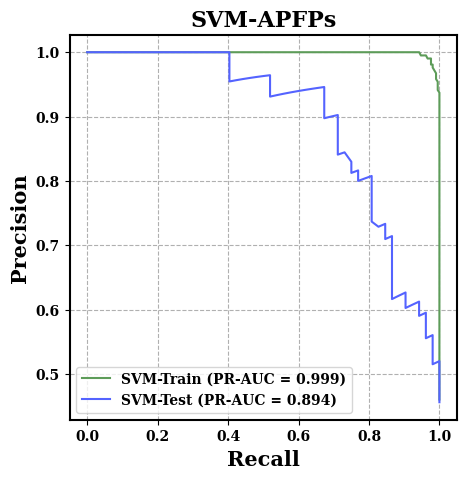

In [36]:
train_X = x_mor_train
train_Y = y_mor_train
test_X = x_mor_test
test_Y = y_mor_test
from sklearn.svm import SVC
SVM = SVC(random_state = 0,
                            class_weight = 'balanced',
                            gamma = 'auto',
                            C = 100 ,
                            kernel = 'sigmoid',
                            shrinking = True,
                            probability=True
                         )
estimator = SVM
estimator.fit(train_X, train_Y)
clf_train = estimator.predict(train_X)
clf_test = estimator.predict(test_X)
print(f"训练集准确度是{accuracy_score(train_Y,clf_train)}")
print(f"测试集准确度是{accuracy_score(test_Y,clf_test)}")
train_matrix = confusion_matrix(train_Y, clf_train)
test_matrix = confusion_matrix(test_Y, clf_test)

# 绘制混淆矩阵
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(train_matrix, annot=True, cmap="Blues", cbar=None,fmt="d")  
#cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Train")
plt.subplot(1, 2, 2)
sns.heatmap(test_matrix, annot=True, cmap="Blues", cbar=None,fmt="d")  
#cbar=None 就会不显示色条,fmt="d"确保中间现实数字
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Test")
plt.savefig("./SVM/混淆矩阵_SVM.svg", dpi = 600)
plt.show()

#########  ROC
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(12, 5))
# 训练集 ROC 图
plt.subplot(1, 2, 1)
y_pro_train = estimator.predict_proba(train_X)[:, 1]  # 获取训练集的预测概率
fpr_train, tpr_train, _ = roc_curve(train_Y, y_pro_train)  # 计算 ROC 曲线的参数
roc_auc_train = auc(fpr_train, tpr_train)  # 计算 AUC
plt.plot(fpr_train, tpr_train, label='SVM-Train (AUC = %0.3f)' % roc_auc_train)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
# 绘制测试集 ROC 图
plt.subplot(1, 2, 2)
y_pro_test = estimator.predict_proba(test_X)[:, 1]  # 获取测试集的预测概率
fpr_test, tpr_test, _ = roc_curve(test_Y, y_pro_test)  # 计算 ROC 曲线的参数
roc_auc_test = auc(fpr_test, tpr_test)  # 计算 AUC
plt.plot(fpr_test, tpr_test, label='SVM-Test (AUC = %0.3f)' % roc_auc_test)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
plt.savefig("./SVM/ROC_SVM.svg", dpi=600)  # 保存图形为 SVG 格式文件
plt.show()  # 显示图形

##绘制组合图
plt.figure(figsize=(5, 5))
# 绘制 ROC 曲线
plt.plot(fpr_train, tpr_train,color='#5D9C59', label='SVM-Train (AUC = %0.3f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test,color='#5463FF', label='SVM-Test (AUC = %0.3f)' % roc_auc_test)
# 绘制对角线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色
# 添加背景网格
plt.grid(True, linestyle='--')
# 设置标题和标签
plt.title('SVM-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('False Positive Rate', fontweight='bold', fontsize=15)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize=15)
plt.legend(loc='lower right')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./SVM/ROC_SVM_组合.svg", dpi=600)
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score, auc
import matplotlib.pyplot as plt
# 训练集PR_AUC图
plt.figure(figsize=(12, 5))
y_pro_train = estimator.predict_proba(train_X)[:, 1]
precision_train, recall_train, _ = precision_recall_curve(train_Y, y_pro_train, pos_label=1)
pr_auc_train = auc(recall_train, precision_train)
plt.subplot(1, 2, 1)
plt.plot(recall_train, precision_train, label='SVM-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
# 测试集PR_AUC图
y_pro_test = estimator.predict_proba(test_X)[:, 1]
precision_test, recall_test, _ = precision_recall_curve(test_Y, y_pro_test, pos_label=1)
pr_auc_test = auc(recall_test, precision_test)
plt.subplot(1, 2, 2)
plt.plot(recall_test, precision_test, label='SVM-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./SVM/PR_SVM.svg", dpi=600)
plt.show()

plt.figure(figsize=(5, 5))
# 绘制训练集PR_AUC图
plt.plot(recall_train, precision_train,color='#5D9C59', label='SVM-Train (PR-AUC = {:.3f})'.format(pr_auc_train))
# 绘制测试集PR_AUC图
plt.plot(recall_test, precision_test,color='#5463FF', label='SVM-Test (PR-AUC = {:.3f})'.format(pr_auc_test))
plt.title('SVM-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('Recall', fontweight='bold', fontsize=15)
plt.ylabel('Precision', fontweight='bold', fontsize=15)
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./SVM/PR_SVM_组合.svg", dpi=600)
plt.show()

### 交叉验证 测试集

In [37]:
# 忽略特定类型的警告
warnings.filterwarnings("ignore", category=DataConversionWarning)

# 导入机器学习库scikit-learn中的SVM分类器和其他必要的工具包
from sklearn.svm import SVC
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    roc_auc_score, f1_score, matthews_corrcoef, 
    make_scorer, confusion_matrix
)
import pandas as pd  # 导入数据处理库pandas
import numpy as np  # 导入数值计算库numpy

# 定义特异性评分函数
def specificity_score(y_true, y_pred):
    """计算特异性（Specificity）."""
    tn, fp, _, _ = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp) if (tn + fp) != 0 else 0

# 定义一个函数用于保存训练集交叉验证的分数到CSV文件，并且打印/保存平均值。
def save_cv_scores(scores, column_names, file_path, label):
    """将交叉验证的成绩保存到CSV文件中。"""
    data = pd.DataFrame(np.array(scores).reshape(1, -1), index=[label], columns=column_names)
    data['average'] = data.mean(axis=1)  # 计算平均分并添加为新列
    data.to_csv(file_path, index=False)  # 将DataFrame保存为CSV文件
    print(f"Data saved to {file_path}")  # 打印保存信息
    return data

# 定义一个函数来处理所有成绩指标并使用`save_cv_scores`函数保存它们。
# 修改process_all_scores函数，添加n_splits参数以反映正确的折数。
def process_all_scores(score_dict, algorithm_name, folder, n_splits):
    """处理所有成绩指标并将其保存到CSV文件中。"""
    results = {}
    for metric, values in score_dict.items():
        file_path = f"{folder}/{n_splits}-CV-{metric.upper()}.csv"  # 使用传入的n_splits来构造文件名
        columns = [str(i+1) for i in range(len(values))]  # 创建列名列表
        results[metric] = save_cv_scores(values, columns, file_path, algorithm_name)  # 保存成绩并添加到结果字典
    return results

# 初始化SVM模型并设置参数
SVM = SVC(random_state = 0,
                            class_weight = 'balanced',
                            gamma = 'auto',
                            C = 100 ,
                            kernel = 'sigmoid',
                            shrinking = True,
                            probability=True
                         )

# 使用SVM分类器进行训练和预测。
def train_and_evaluate(model, train_features, train_labels, test_features, test_labels):
    """训练模型并评估其在训练集和测试集上的性能。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    # 打印训练集和测试集的准确率
    print(f"Training Set Accuracy: {accuracy_score(train_labels, clf_train_preds)}")
    print(f"Test Set Accuracy: {accuracy_score(test_labels, clf_test_preds)}")

# 初始化用于训练和测试的特征和标签变量。
train_X, train_Y = x_mor_train, y_mor_train  # 训练集特征和标签
test_X, test_Y = x_mor_test, y_mor_test  # 测试集特征和标签

# 执行训练和评估。
train_and_evaluate(SVM, train_X, train_Y, test_X, test_Y)

# 定义一个函数进行交叉验证和成绩的保存。
# 修改perform_cross_validation函数的调用，传入n_splits参数。
def perform_cross_validation(model, train_features, train_labels, n_splits, folder):
    """执行交叉验证和成绩处理。"""
    cv_strategy = StratifiedKFold(n_splits=n_splits)  # 使用分层k折交叉验证
    # 定义评分方法
    scoring_methods = {
        'accuracy': 'accuracy',
        'precision': make_scorer(precision_score, average='macro'),
        'recall': make_scorer(recall_score, average='macro'),
        'roc_auc': 'roc_auc_ovr',
        'f1': make_scorer(f1_score, average='macro'),
        'matthews_corrcoef': make_scorer(matthews_corrcoef),
        'specificity': make_scorer(specificity_score)  # 添加特异性评分
    }
    # 执行交叉验证
    scores = cross_validate(model, train_features, train_labels, scoring=scoring_methods, cv=cv_strategy)
    # 格式化分数并返回结果
    formatted_scores = {key.split('_')[-1]: scores[key] for key in scores if key.startswith('test_')}
    # 注意这里传入n_splits
    return process_all_scores(formatted_scores, model.__class__.__name__, folder, n_splits)

# 执行5折交叉验证然后是10折交叉验证。
# 注意这里传入n_splits参数到process_all_scores函数。
results_5_fold = perform_cross_validation(SVM, train_X, train_Y, 5, "./SVM")  # 5折交叉验证结果
results_10_fold = perform_cross_validation(SVM, train_X, train_Y, 10, "./SVM")  # 10折交叉验证结果

Training Set Accuracy: 0.9823788546255506
Test Set Accuracy: 0.8157894736842105
Data saved to ./SVM/5-CV-ACCURACY.csv
Data saved to ./SVM/5-CV-PRECISION.csv
Data saved to ./SVM/5-CV-RECALL.csv
Data saved to ./SVM/5-CV-AUC.csv
Data saved to ./SVM/5-CV-F1.csv
Data saved to ./SVM/5-CV-CORRCOEF.csv
Data saved to ./SVM/5-CV-SPECIFICITY.csv
Data saved to ./SVM/10-CV-ACCURACY.csv
Data saved to ./SVM/10-CV-PRECISION.csv
Data saved to ./SVM/10-CV-RECALL.csv
Data saved to ./SVM/10-CV-AUC.csv
Data saved to ./SVM/10-CV-F1.csv
Data saved to ./SVM/10-CV-CORRCOEF.csv
Data saved to ./SVM/10-CV-SPECIFICITY.csv


In [38]:
import pandas as pd

def train_and_evaluate(model, train_features, train_labels, test_features, test_labels, output_file):
    """训练模型并评估其在训练集和测试集上的性能，包括多种评估指标，并将结果保存到CSV文件。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    
    # 计算训练集上的性能指标
    metrics = {
        'Train_Accuracy': accuracy_score(train_labels, clf_train_preds),
        'Train_Precision': precision_score(train_labels, clf_train_preds, average='macro'),
        'Train_Recall': recall_score(train_labels, clf_train_preds, average='macro'),
        'Train_F1': f1_score(train_labels, clf_train_preds, average='macro'),
        'Train_MCC': matthews_corrcoef(train_labels, clf_train_preds),
        'Train_Specificity': specificity_score(train_labels, clf_train_preds),
        'Train_ROC_AUC': roc_auc_score(train_labels, model.predict_proba(train_features)[:, 1], multi_class='ovr'),
        
        'Test_Accuracy': accuracy_score(test_labels, clf_test_preds),
        'Test_Precision': precision_score(test_labels, clf_test_preds, average='macro'),
        'Test_Recall': recall_score(test_labels, clf_test_preds, average='macro'),
        'Test_F1': f1_score(test_labels, clf_test_preds, average='macro'),
        'Test_MCC': matthews_corrcoef(test_labels, clf_test_preds),
        'Test_Specificity': specificity_score(test_labels, clf_test_preds),
        'Test_ROC_AUC': roc_auc_score(test_labels, model.predict_proba(test_features)[:, 1], multi_class='ovr')
    }
    
    # 将字典转换为DataFrame并保存到CSV文件
    df = pd.DataFrame([metrics])
    df.to_csv(output_file, index=False)
    print(f"Metrics saved to {output_file}")

# 执行训练和评估，输出结果
train_and_evaluate(SVM, train_X, train_Y, test_X, test_Y,"./SVM/训练和评估.csv")

Metrics saved to ./SVM/训练和评估.csv


# RF参数搜索

In [39]:
RandomForestClassifier_auto = RandomForestClassifier(random_state=0,n_jobs=-1)
def RandomForestClassifier_model(X,Y):

    # 首先实例化各个回归方法
    param_dict = {"criterion":['gini','entropy'],
                        "max_features":["log2",'sqrt'],
                        "class_weight":['balance','balanced_subsample'],
                        "bootstrap":[True,False],
                        "oob_score":[True,False]}
    estimator = GridSearchCV(estimator = RandomForestClassifier_auto, param_grid=param_dict, cv=cv,n_jobs=-1,scoring = "roc_auc")
    estimator.fit(X,Y)
    return estimator.best_params_,estimator.best_score_,estimator.best_estimator_

tmp_1,tmp_2,RandomforestClassifier_auto = RandomForestClassifier_model(X,Y)
print(tmp_1,tmp_2,RandomForestClassifier_auto)

/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of

{'bootstrap': True, 'class_weight': 'balanced_subsample', 'criterion': 'entropy', 'max_features': 'sqrt', 'oob_score': True} 0.926368247647491 RandomForestClassifier(n_jobs=-1, random_state=0)


In [40]:
RandomForestClassifier_auto = RandomForestClassifier(random_state=0,n_jobs=-1)
from time import time
begin_time = time()
# Search optimal hyperparameter
n_estimators_range=[int(x) for x in np.linspace(start=10,stop=210,num=10)]
max_depth_range=[int(x) for x in np.linspace(5,25,num=10)]
min_samples_split_range=[int(x) for x in np.linspace(5,25,num=10)]
min_samples_leaf_range=[3,4,5,6,7]
# max_features=['sqrt','log2']
# min_samples_leaf=
RandomForestClassifier_auto = RandomForestClassifier(random_state=0,n_jobs=-1)

random_forest_hp_range={'n_estimators':n_estimators_range,
                        'max_depth':max_depth_range,
                        'min_samples_split':min_samples_split_range,
                        'min_samples_leaf':min_samples_leaf_range,
                        "criterion":['entropy'],
                        "max_features":['sqrt'],
                        "class_weight":['balanced_subsample'],
                        "bootstrap":[True],
                        "oob_score":[True]
                       }
print(random_forest_hp_range)

estimator_all_roc = GridSearchCV(estimator=RandomForestClassifier_auto,
                                 param_grid=random_forest_hp_range,
                                 cv=cv,
                                 n_jobs=-1,
                                 scoring="roc_auc",verbose=1)
# %%time
estimator_all_roc.fit(X, Y)
end_time = time()
print({end_time - begin_time})
print(estimator_all_roc.best_params_)
print(estimator_all_roc.best_score_)
tmp = pd.DataFrame(estimator_all_roc.cv_results_)
df_fig = tmp[["mean_test_score","params"]]
df_fig.to_csv("./RF/tmp2.csv",index=False)
df_fig["n_estimators"] = 1
df_fig['max_depth'] = 1
df_fig["min_samples_split"] = 1
df_fig['min_samples_leaf']=1
for i in range(0,df_fig.shape[0]):
    dict_tmp = df_fig["params"].iloc[i]
    df_fig["n_estimators"].iloc[i] = dict_tmp["n_estimators"]
    df_fig["max_depth"].iloc[i] = dict_tmp["max_depth"]
    df_fig["min_samples_split"].iloc[i] = dict_tmp["min_samples_split"]
    df_fig['min_samples_leaf'].iloc[i]=dict_tmp['min_samples_leaf']
    
df_fig.head(50)
df_fig.to_csv("./RF/网格搜索结果RF.csv",index=False)
df_fig.describe()

{'n_estimators': [10, 32, 54, 76, 98, 121, 143, 165, 187, 210], 'max_depth': [5, 7, 9, 11, 13, 16, 18, 20, 22, 25], 'min_samples_split': [5, 7, 9, 11, 13, 16, 18, 20, 22, 25], 'min_samples_leaf': [3, 4, 5, 6, 7], 'criterion': ['entropy'], 'max_features': ['sqrt'], 'class_weight': ['balanced_subsample'], 'bootstrap': [True], 'oob_score': [True]}
Fitting 5 folds for each of 5000 candidates, totalling 25000 fits


/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/home/md06/.local/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of

{508.05508279800415}
{'bootstrap': True, 'class_weight': 'balanced_subsample', 'criterion': 'entropy', 'max_depth': 9, 'max_features': 'sqrt', 'min_samples_leaf': 3, 'min_samples_split': 5, 'n_estimators': 121, 'oob_score': True}
0.9321007845646969


,mean_test_score,n_estimators,max_depth,min_samples_split,min_samples_leaf
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,0.918923,109.600000,14.600000,14.600000,5.000000
std,0.004581,63.789136,6.344135,6.344135,1.414355
min,0.897713,10.000000,5.000000,5.000000,3.000000
25%,0.915878,54.000000,9.000000,9.000000,4.000000
50%,0.918833,109.500000,14.500000,14.500000,5.000000
75%,0.922045,165.000000,20.000000,20.000000,6.000000
max,0.932101,210.000000,25.000000,25.000000,7.000000


/home/md06/.local/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/md06/.local/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/md06/.local/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/md06/.local/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column

In [41]:
print(estimator_all_roc.best_params_)

{'bootstrap': True, 'class_weight': 'balanced_subsample', 'criterion': 'entropy', 'max_depth': 9, 'max_features': 'sqrt', 'min_samples_leaf': 3, 'min_samples_split': 5, 'n_estimators': 121, 'oob_score': True}


训练集准确度是0.8942731277533039
测试集准确度是0.8421052631578947


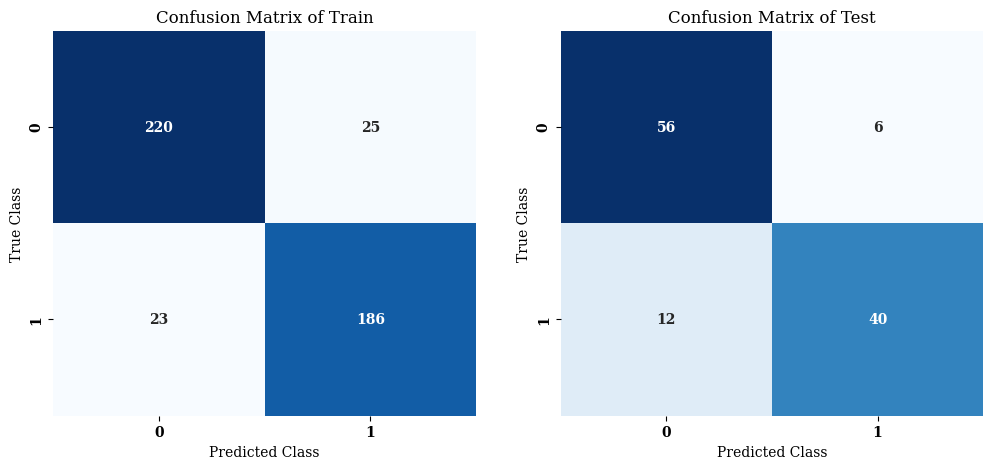

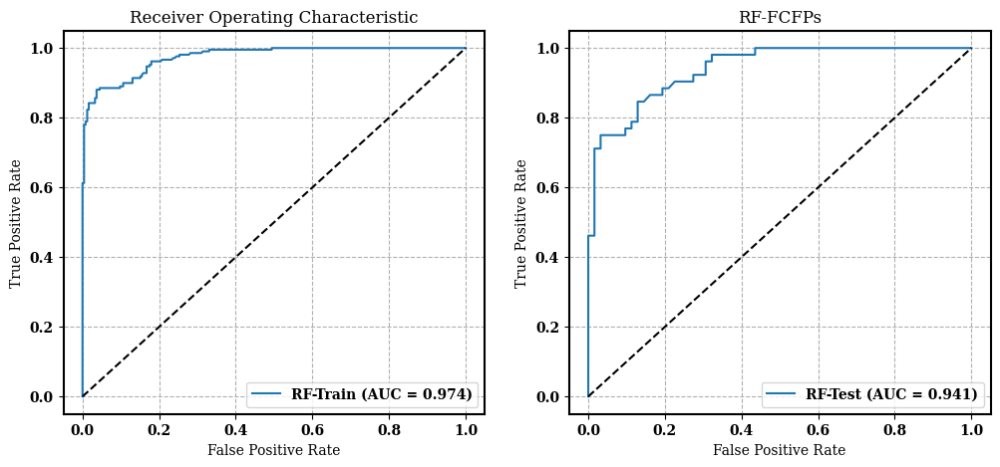

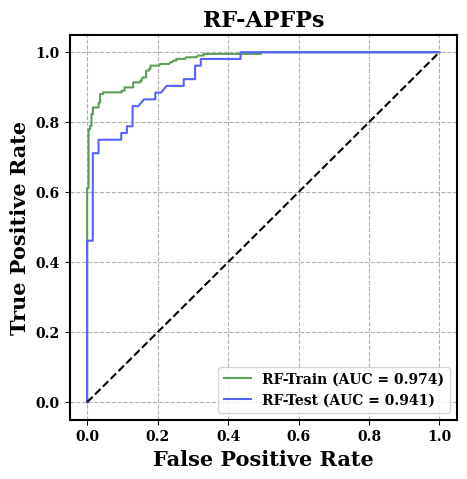

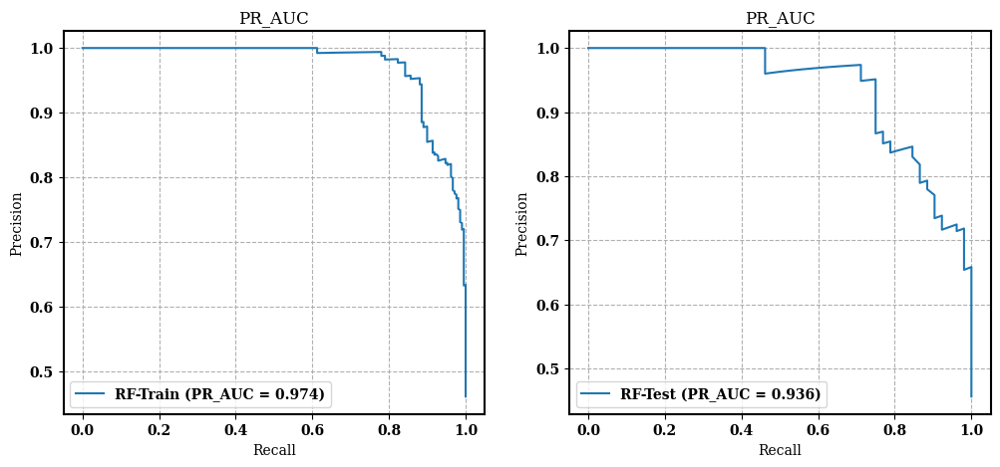

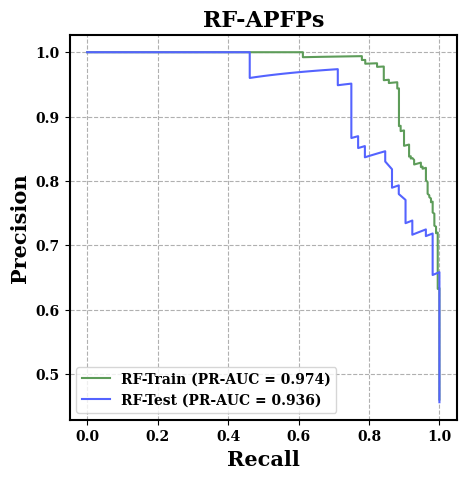

In [42]:
train_X = x_mor_train
train_Y = y_mor_train
test_X = x_mor_test
test_Y = y_mor_test

RF = RandomForestClassifier(random_state = 0,
                            class_weight = 'balanced_subsample',
                            criterion = 'entropy',
                            max_features = 'log2',
                            bootstrap = True,
                            max_depth = 9,
                            min_samples_leaf = 3,
                            min_samples_split = 5,
                            n_estimators = 121,
                            oob_score = True)

estimator = RF
estimator.fit(train_X, train_Y)
clf_train = estimator.predict(train_X)
clf_test = estimator.predict(test_X)
print(f"训练集准确度是{accuracy_score(train_Y,clf_train)}")
print(f"测试集准确度是{accuracy_score(test_Y,clf_test)}")
train_matrix = confusion_matrix(train_Y, clf_train)
test_matrix = confusion_matrix(test_Y, clf_test)

plt.rc('axes', linewidth=1.5)

# 绘制混淆矩阵
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(train_matrix, annot=True, cmap="Blues", cbar=None,fmt="d")
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Train")
plt.subplot(1, 2, 2)
sns.heatmap(test_matrix, annot=True, cmap="Blues", cbar=None,fmt="d")
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Test")
plt.savefig("./RF/混淆矩阵_RF.svg", dpi = 300)
plt.show()

#########  ROC
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(12, 5))
# 训练集 ROC 图
plt.subplot(1, 2, 1)
y_pro_train = estimator.predict_proba(train_X)[:, 1]  # 获取训练集的预测概率
fpr_train, tpr_train, _ = roc_curve(train_Y, y_pro_train)  # 计算 ROC 曲线的参数
roc_auc_train = auc(fpr_train, tpr_train)  # 计算 AUC
plt.plot(fpr_train, tpr_train, label='RF-Train (AUC = %0.3f)' % roc_auc_train)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
# 绘制测试集 ROC 图
plt.subplot(1, 2, 2)
y_pro_test = estimator.predict_proba(test_X)[:, 1]  # 获取测试集的预测概率
fpr_test, tpr_test, _ = roc_curve(test_Y, y_pro_test)  # 计算 ROC 曲线的参数
roc_auc_test = auc(fpr_test, tpr_test)  # 计算 AUC
plt.plot(fpr_test, tpr_test, label='RF-Test (AUC = %0.3f)' % roc_auc_test)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('RF-FCFPs')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
plt.savefig("./RF/ROC_RF.svg", dpi=600)  # 保存图形为 SVG 格式文件
plt.show()  # 显示图形

##绘制组合图
plt.figure(figsize=(5, 5))
# 绘制 ROC 曲线
plt.plot(fpr_train, tpr_train,color='#5D9C59', label='RF-Train (AUC = %0.3f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test,color='#5463FF', label='RF-Test (AUC = %0.3f)' % roc_auc_test)
# 绘制对角线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色
# 添加背景网格
plt.grid(True, linestyle='--')
# 设置标题和标签
plt.title('RF-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('False Positive Rate', fontweight='bold', fontsize=15)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize=15)
plt.legend(loc='lower right')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./RF/ROC_RF_组合.svg", dpi=600)
plt.show()
from sklearn.metrics import precision_recall_curve, average_precision_score, auc
import matplotlib.pyplot as plt
# 训练集PR_AUC图
plt.figure(figsize=(12, 5))
y_pro_train = estimator.predict_proba(train_X)[:, 1]
precision_train, recall_train, _ = precision_recall_curve(train_Y, y_pro_train, pos_label=1)
pr_auc_train = auc(recall_train, precision_train)
plt.subplot(1, 2, 1)
plt.plot(recall_train, precision_train, label='RF-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
# 测试集PR_AUC图
y_pro_test = estimator.predict_proba(test_X)[:, 1]
precision_test, recall_test, _ = precision_recall_curve(test_Y, y_pro_test, pos_label=1)
pr_auc_test = auc(recall_test, precision_test)
plt.subplot(1, 2, 2)
plt.plot(recall_test, precision_test, label='RF-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./RF/PR_RF.svg", dpi=600)
plt.show()

plt.figure(figsize=(5, 5))
# 绘制训练集PR_AUC图
plt.plot(recall_train, precision_train,color='#5D9C59', label='RF-Train (PR-AUC = {:.3f})'.format(pr_auc_train))
# 绘制测试集PR_AUC图
plt.plot(recall_test, precision_test,color='#5463FF', label='RF-Test (PR-AUC = {:.3f})'.format(pr_auc_test))
plt.title('RF-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('Recall', fontweight='bold', fontsize=15)
plt.ylabel('Precision', fontweight='bold', fontsize=15)
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./RF/PR_RF_组合.svg", dpi=600)
plt.show()

### 交叉验证 测试集

In [43]:
# 忽略特定类型的警告
warnings.filterwarnings("ignore", category=DataConversionWarning)

# 导入机器学习库scikit-learn中的RF分类器和其他必要的工具包
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    roc_auc_score, f1_score, matthews_corrcoef, 
    make_scorer, confusion_matrix
)
import pandas as pd  # 导入数据处理库pandas
import numpy as np  # 导入数值计算库numpy

# 定义特异性评分函数
def specificity_score(y_true, y_pred):
    """计算特异性（Specificity）."""
    tn, fp, _, _ = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp) if (tn + fp) != 0 else 0

# 定义一个函数用于保存训练集交叉验证的分数到CSV文件，并且打印/保存平均值。
def save_cv_scores(scores, column_names, file_path, label):
    """将交叉验证的成绩保存到CSV文件中。"""
    data = pd.DataFrame(np.array(scores).reshape(1, -1), index=[label], columns=column_names)
    data['average'] = data.mean(axis=1)  # 计算平均分并添加为新列
    data.to_csv(file_path, index=False)  # 将DataFrame保存为CSV文件
    print(f"Data saved to {file_path}")  # 打印保存信息
    return data

# 定义一个函数来处理所有成绩指标并使用`save_cv_scores`函数保存它们。
# 修改process_all_scores函数，添加n_splits参数以反映正确的折数。
def process_all_scores(score_dict, algorithm_name, folder, n_splits):
    """处理所有成绩指标并将其保存到CSV文件中。"""
    results = {}
    for metric, values in score_dict.items():
        file_path = f"{folder}/{n_splits}-CV-{metric.upper()}.csv"  # 使用传入的n_splits来构造文件名
        columns = [str(i+1) for i in range(len(values))]  # 创建列名列表
        results[metric] = save_cv_scores(values, columns, file_path, algorithm_name)  # 保存成绩并添加到结果字典
    return results
    
RF = RandomForestClassifier(random_state = 0,
                            class_weight = 'balanced_subsample',
                            criterion = 'entropy',
                            max_features = 'log2',
                            bootstrap = True,
                            max_depth = 9,
                            min_samples_leaf = 3,
                            min_samples_split = 5,
                            n_estimators = 121,
                            oob_score = True)

# 使用RF分类器进行训练和预测。
def train_and_evaluate(model, train_features, train_labels, test_features, test_labels):
    """训练模型并评估其在训练集和测试集上的性能。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    # 打印训练集和测试集的准确率
    print(f"Training Set Accuracy: {accuracy_score(train_labels, clf_train_preds)}")
    print(f"Test Set Accuracy: {accuracy_score(test_labels, clf_test_preds)}")

# 初始化用于训练和测试的特征和标签变量。
train_X, train_Y = x_mor_train, y_mor_train  # 训练集特征和标签
test_X, test_Y = x_mor_test, y_mor_test  # 测试集特征和标签

# 执行训练和评估。
train_and_evaluate(RF, train_X, train_Y, test_X, test_Y)

# 定义一个函数进行交叉验证和成绩的保存。
# 修改perform_cross_validation函数的调用，传入n_splits参数。
def perform_cross_validation(model, train_features, train_labels, n_splits, folder):
    """执行交叉验证和成绩处理。"""
    cv_strategy = StratifiedKFold(n_splits=n_splits)  # 使用分层k折交叉验证
    # 定义评分方法
    scoring_methods = {
        'accuracy': 'accuracy',
        'precision': make_scorer(precision_score, average='macro'),
        'recall': make_scorer(recall_score, average='macro'),
        'roc_auc': 'roc_auc_ovr',
        'f1': make_scorer(f1_score, average='macro'),
        'matthews_corrcoef': make_scorer(matthews_corrcoef),
        'specificity': make_scorer(specificity_score)  # 添加特异性评分
    }
    # 执行交叉验证
    scores = cross_validate(model, train_features, train_labels, scoring=scoring_methods, cv=cv_strategy)
    # 格式化分数并返回结果
    formatted_scores = {key.split('_')[-1]: scores[key] for key in scores if key.startswith('test_')}
    # 注意这里传入n_splits
    return process_all_scores(formatted_scores, model.__class__.__name__, folder, n_splits)

# 执行5折交叉验证然后是10折交叉验证。
# 注意这里传入n_splits参数到process_all_scores函数。
results_5_fold = perform_cross_validation(RF, train_X, train_Y, 5, "./RF")  # 5折交叉验证结果
results_10_fold = perform_cross_validation(RF, train_X, train_Y, 10, "./RF")  # 10折交叉验证结果

Training Set Accuracy: 0.8942731277533039
Test Set Accuracy: 0.8421052631578947
Data saved to ./RF/5-CV-ACCURACY.csv
Data saved to ./RF/5-CV-PRECISION.csv
Data saved to ./RF/5-CV-RECALL.csv
Data saved to ./RF/5-CV-AUC.csv
Data saved to ./RF/5-CV-F1.csv
Data saved to ./RF/5-CV-CORRCOEF.csv
Data saved to ./RF/5-CV-SPECIFICITY.csv
Data saved to ./RF/10-CV-ACCURACY.csv
Data saved to ./RF/10-CV-PRECISION.csv
Data saved to ./RF/10-CV-RECALL.csv
Data saved to ./RF/10-CV-AUC.csv
Data saved to ./RF/10-CV-F1.csv
Data saved to ./RF/10-CV-CORRCOEF.csv
Data saved to ./RF/10-CV-SPECIFICITY.csv


In [44]:
import pandas as pd

def train_and_evaluate(model, train_features, train_labels, test_features, test_labels, output_file):
    """训练模型并评估其在训练集和测试集上的性能，包括多种评估指标，并将结果保存到CSV文件。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    
    # 计算训练集上的性能指标
    metrics = {
        'Train_Accuracy': accuracy_score(train_labels, clf_train_preds),
        'Train_Precision': precision_score(train_labels, clf_train_preds, average='macro'),
        'Train_Recall': recall_score(train_labels, clf_train_preds, average='macro'),
        'Train_F1': f1_score(train_labels, clf_train_preds, average='macro'),
        'Train_MCC': matthews_corrcoef(train_labels, clf_train_preds),
        'Train_Specificity': specificity_score(train_labels, clf_train_preds),
        'Train_ROC_AUC': roc_auc_score(train_labels, model.predict_proba(train_features)[:, 1], multi_class='ovr'),
        
        'Test_Accuracy': accuracy_score(test_labels, clf_test_preds),
        'Test_Precision': precision_score(test_labels, clf_test_preds, average='macro'),
        'Test_Recall': recall_score(test_labels, clf_test_preds, average='macro'),
        'Test_F1': f1_score(test_labels, clf_test_preds, average='macro'),
        'Test_MCC': matthews_corrcoef(test_labels, clf_test_preds),
        'Test_Specificity': specificity_score(test_labels, clf_test_preds),
        'Test_ROC_AUC': roc_auc_score(test_labels, model.predict_proba(test_features)[:, 1], multi_class='ovr')
    }
    
    # 将字典转换为DataFrame并保存到CSV文件
    df = pd.DataFrame([metrics])
    df.to_csv(output_file, index=False)
    print(f"Metrics saved to {output_file}")

# 执行训练和评估，输出结果
train_and_evaluate(RF, train_X, train_Y, test_X, test_Y,"./RF/训练和评估.csv")

Metrics saved to ./RF/训练和评估.csv


# XGBoost参数搜索

In [23]:
import xgboost as xgb
from xgboost import plot_importance
from xgboost.sklearn import XGBClassifier
xgb = XGBClassifier(
    random_state=0,
    objective='binary:logistic'
)
from time import time
begin_time = time()

learning_rate_range=[0.1]
n_estimators_range=[int(x) for x in np.linspace(start=10,stop=210,num=10)]
max_depth_range=[int(x) for x in np.linspace(3,23,num=10)]
min_child_weight_range=[i for i in range(1,3,5)]
gamma_range=[i/10.0 for i in range(0,10)]
subsample_range=[i/10.0 for i in range(6,10)]
colsample_bytree_range=[i/10.0 for i in range(6,10)]
reg_alpha_range=[0.1]    
reg_lambda_range=[0.1]    
random_forest_hp_range={'n_estimators':n_estimators_range,
                        'max_depth':max_depth_range,
                        'min_child_weight':min_child_weight_range,
                        'gamma':gamma_range,
                        'subsample':subsample_range,
                        'colsample_bytree':colsample_bytree_range,
                        'reg_alpha':reg_alpha_range,
                        'reg_lambda':reg_lambda_range
                       }
print(random_forest_hp_range)

estimator_all_roc = GridSearchCV(estimator=xgb,
                                 param_grid=random_forest_hp_range,
                                 cv=cv,
                                 n_jobs=-1,
                                 scoring="roc_auc",verbose=1)
# %%time
estimator_all_roc.fit(X, Y)
end_time = time()
print({end_time - begin_time})
print(estimator_all_roc.best_params_)
print(estimator_all_roc.best_score_)
tmp = pd.DataFrame(estimator_all_roc.cv_results_)
df_fig = tmp[["mean_test_score","params"]]
df_fig.to_csv("./XGBoost/xgbtmp.csv",index=False)
df_fig = pd.read_csv("./XGBoost/xgbtmp.csv")
df_fig["colsample_bytree"] = 1
df_fig["gamma"] = 1
df_fig["max_depth"] = 1
df_fig["min_child_weight"]=1
df_fig["n_estimators"]=1
df_fig["reg_alpha"]=1
df_fig["reg_lambda"]=1
df_fig["subsample"]=1
for i in range(0,df_fig.shape[0]):
    dict_tmp = df_fig['params'].iloc[i]
    dict_tmp = eval(dict_tmp)
    df_fig["colsample_bytree"].iloc[i] = dict_tmp["colsample_bytree"]
    df_fig["gamma"].iloc[i] = dict_tmp["gamma"]
    df_fig["max_depth"].iloc[i] = dict_tmp["max_depth"]
    df_fig["min_child_weight"].iloc[i] = dict_tmp["min_child_weight"]
    df_fig["n_estimators"].iloc[i] = dict_tmp["n_estimators"]
    df_fig["reg_alpha"].iloc[i] = dict_tmp["reg_alpha"]
    df_fig["reg_lambda"].iloc[i] = dict_tmp["reg_lambda"]
    df_fig["subsample"].iloc[i] = dict_tmp["subsample"]
        
df_fig.head(50)
df_fig.to_csv("./XGBoost/xgb网格搜索结果.csv",index=False)
df_fig.describe()

{'n_estimators': [10, 32, 54, 76, 98, 121, 143, 165, 187, 210], 'max_depth': [3, 5, 7, 9, 11, 14, 16, 18, 20, 23], 'min_child_weight': [1], 'gamma': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9], 'subsample': [0.6, 0.7, 0.8, 0.9], 'colsample_bytree': [0.6, 0.7, 0.8, 0.9], 'reg_alpha': [0.1], 'reg_lambda': [0.1]}
Fitting 5 folds for each of 16000 candidates, totalling 80000 fits
{5309.324749469757}
{'colsample_bytree': 0.9, 'gamma': 0.3, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 210, 'reg_alpha': 0.1, 'reg_lambda': 0.1, 'subsample': 0.7}
0.9392258645618525


,mean_test_score,colsample_bytree,gamma,max_depth,min_child_weight,n_estimators,reg_alpha,reg_lambda,subsample
count,16000.000000,16000.000000,16000.000000,16000.000000,16000.0,16000.00000,1.600000e+04,1.600000e+04,16000.000000
mean,0.923933,0.750000,0.450000,12.600000,1.0,109.60000,1.000000e-01,1.000000e-01,0.750000
std,0.005521,0.111807,0.287237,6.343699,0.0,63.78475,2.775644e-17,2.775644e-17,0.111807
min,0.895748,0.600000,0.000000,3.000000,1.0,10.00000,1.000000e-01,1.000000e-01,0.600000
25%,0.920894,0.675000,0.200000,7.000000,1.0,54.00000,1.000000e-01,1.000000e-01,0.675000
50%,0.924454,0.750000,0.450000,12.500000,1.0,109.50000,1.000000e-01,1.000000e-01,0.750000
75%,0.927638,0.825000,0.700000,18.000000,1.0,165.00000,1.000000e-01,1.000000e-01,0.825000
max,0.939226,0.900000,0.900000,23.000000,1.0,210.00000,1.000000e-01,1.000000e-01,0.900000


In [24]:
print(estimator_all_roc.best_params_)

{'colsample_bytree': 0.9, 'gamma': 0.3, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 210, 'reg_alpha': 0.1, 'reg_lambda': 0.1, 'subsample': 0.7}


训练集准确度是0.986784140969163
测试集准确度是0.8508771929824561


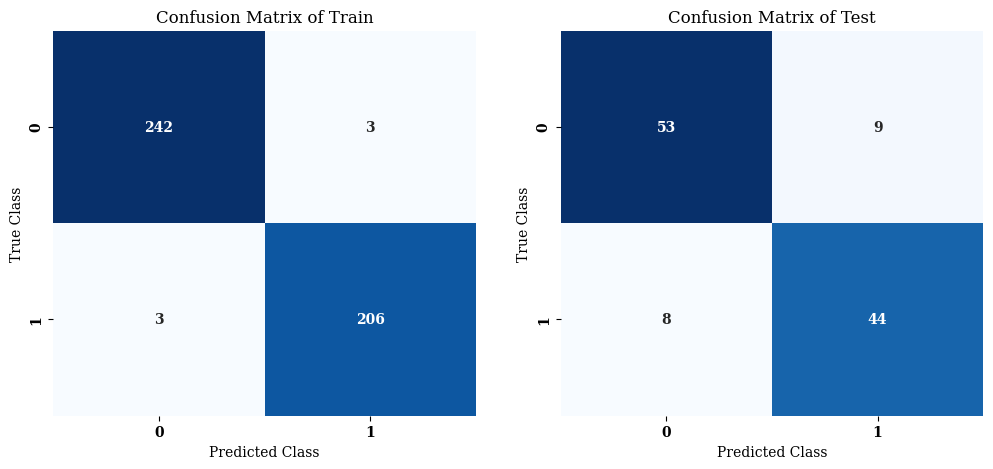

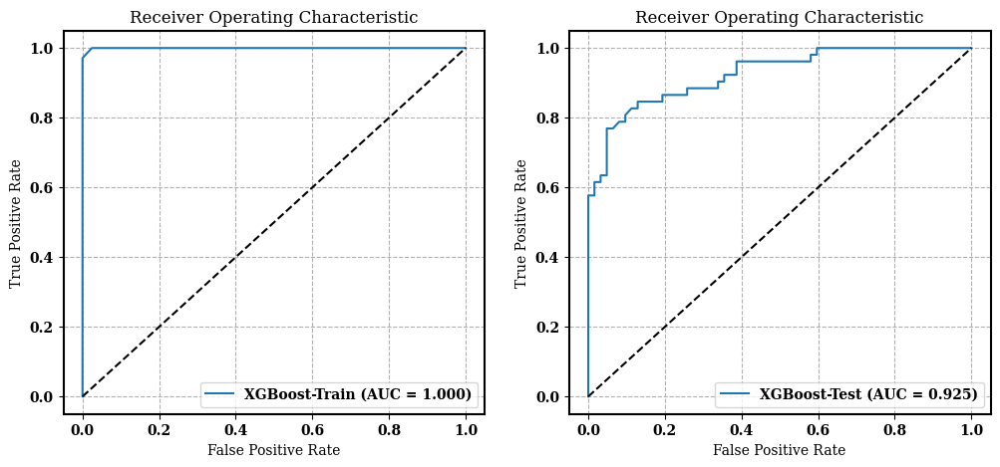

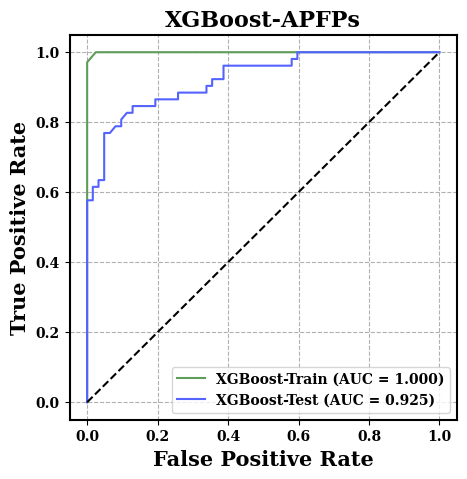

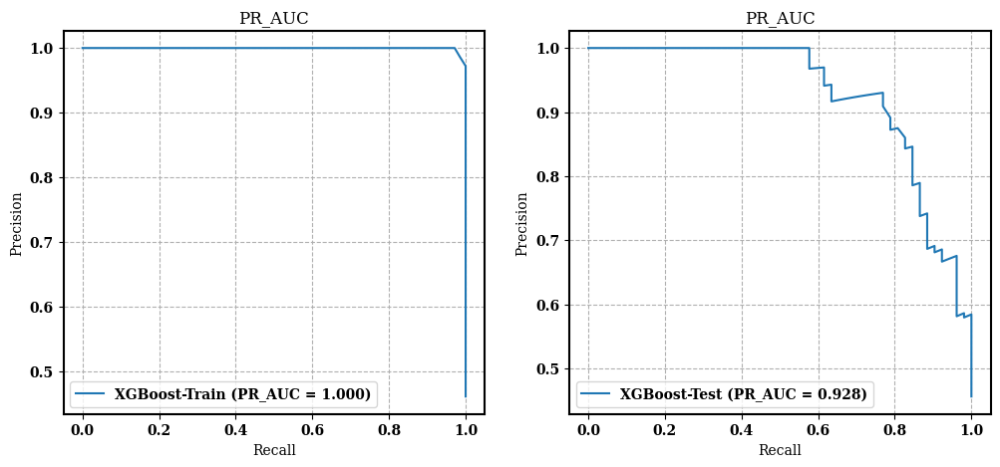

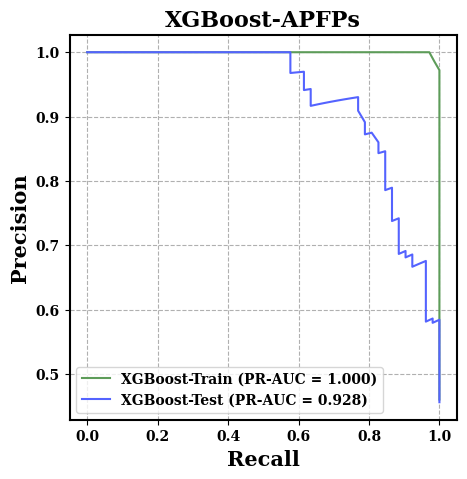

In [25]:
from xgboost import plot_importance
from xgboost.sklearn import XGBClassifier

train_X = x_mor_train  # 训练集特征数据
train_Y = y_mor_train  # 训练集目标数据（标签）
test_X = x_mor_test    # 测试集特征数据
test_Y = y_mor_test    # 测试集目标数据（标签）

xgb = XGBClassifier(
    random_state=0,
    objective='binary:logistic',
    colsample_bytree = 0.9,
    gamma = 0.3,
    max_depth = 5,
    min_child_weight = 1,
    n_estimators = 210,
    reg_alpha = 0.1,
    reg_lambda = 0.1,
    subsample = 0.7
)
# 训练模型
estimator = xgb
estimator.fit(train_X, train_Y)
# 在训练集和测试集上进行预测
clf_train = estimator.predict(train_X)
clf_test = estimator.predict(test_X)
print(f"训练集准确度是{accuracy_score(train_Y,clf_train)}")
print(f"测试集准确度是{accuracy_score(test_Y,clf_test)}")

# 生成训练集和测试集的混淆矩阵
train_matrix = confusion_matrix(train_Y, clf_train)
test_matrix = confusion_matrix(test_Y, clf_test)
# 绘制混淆矩阵
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(train_matrix, annot=True, cmap="Blues", cbar=None,fmt="d") 
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Train")
plt.subplot(1, 2, 2)
sns.heatmap(test_matrix, annot=True, cmap="Blues", cbar=None,fmt="d")
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Test")
plt.savefig("./XGBoost/混淆矩阵_XGB.svg", dpi = 600)
plt.show()

#########  ROC
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(12, 5))
# 训练集 ROC 图
plt.subplot(1, 2, 1)
y_pro_train = estimator.predict_proba(train_X)[:, 1]  # 获取训练集的预测概率
fpr_train, tpr_train, _ = roc_curve(train_Y, y_pro_train)  # 计算 ROC 曲线的参数
roc_auc_train = auc(fpr_train, tpr_train)  # 计算 AUC
plt.plot(fpr_train, tpr_train, label='XGBoost-Train (AUC = %0.3f)' % roc_auc_train)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')

# 绘制测试集 ROC 图
plt.subplot(1, 2, 2)
y_pro_test = estimator.predict_proba(test_X)[:, 1]  # 获取测试集的预测概率
fpr_test, tpr_test, _ = roc_curve(test_Y, y_pro_test)  # 计算 ROC 曲线的参数
roc_auc_test = auc(fpr_test, tpr_test)  # 计算 AUC
plt.plot(fpr_test, tpr_test, label='XGBoost-Test (AUC = %0.3f)' % roc_auc_test)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
plt.savefig("./XGBoost/ROC_XGBoost.svg", dpi=600)  # 保存图形为 SVG 格式文件
plt.show()  # 显示图形

##绘制组合图
plt.figure(figsize=(5, 5))
# 绘制 ROC 曲线
plt.plot(fpr_train, tpr_train,color='#5D9C59', label='XGBoost-Train (AUC = %0.3f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test,color='#5463FF', label='XGBoost-Test (AUC = %0.3f)' % roc_auc_test)
# 绘制对角线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色
# 添加背景网格
plt.grid(True, linestyle='--')
# 设置标题和标签
plt.title('XGBoost-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('False Positive Rate', fontweight='bold', fontsize=15)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize=15)
plt.legend(loc='lower right')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./XGBoost/ROC_XGBoost_组合.svg", dpi=600)
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score, auc
import matplotlib.pyplot as plt
# 训练集PR_AUC图
plt.figure(figsize=(12, 5))
y_pro_train = estimator.predict_proba(train_X)[:, 1]
precision_train, recall_train, _ = precision_recall_curve(train_Y, y_pro_train, pos_label=1)
pr_auc_train = auc(recall_train, precision_train)
plt.subplot(1, 2, 1)
plt.plot(recall_train, precision_train, label='XGBoost-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)

# 测试集PR_AUC图
y_pro_test = estimator.predict_proba(test_X)[:, 1]
precision_test, recall_test, _ = precision_recall_curve(test_Y, y_pro_test, pos_label=1)
pr_auc_test = auc(recall_test, precision_test)
plt.subplot(1, 2, 2)
plt.plot(recall_test, precision_test, label='XGBoost-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./XGBoost/PR_XGBoost.svg", dpi=600)
plt.show()

plt.figure(figsize=(5, 5))
# 绘制训练集PR_AUC图
plt.plot(recall_train, precision_train,color='#5D9C59', label='XGBoost-Train (PR-AUC = {:.3f})'.format(pr_auc_train))
# 绘制测试集PR_AUC图
plt.plot(recall_test, precision_test,color='#5463FF', label='XGBoost-Test (PR-AUC = {:.3f})'.format(pr_auc_test))
plt.title('XGBoost-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('Recall', fontweight='bold', fontsize=15)
plt.ylabel('Precision', fontweight='bold', fontsize=15)
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./XGBoost/PR_XGBoost_组合.svg", dpi=600)
plt.show()

### 交叉验证 测试集

In [26]:
# 忽略特定类型的警告
warnings.filterwarnings("ignore", category=DataConversionWarning)

# 导入机器学习库scikit-learn中的XGB分类器和其他必要的工具包
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    roc_auc_score, f1_score, matthews_corrcoef, 
    make_scorer, confusion_matrix
)
import pandas as pd  # 导入数据处理库pandas
import numpy as np  # 导入数值计算库numpy

# 定义特异性评分函数
def specificity_score(y_true, y_pred):
    """计算特异性（Specificity）."""
    tn, fp, _, _ = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp) if (tn + fp) != 0 else 0

# 定义一个函数用于保存训练集交叉验证的分数到CSV文件，并且打印/保存平均值。
def save_cv_scores(scores, column_names, file_path, label):
    """将交叉验证的成绩保存到CSV文件中。"""
    data = pd.DataFrame(np.array(scores).reshape(1, -1), index=[label], columns=column_names)
    data['average'] = data.mean(axis=1)  # 计算平均分并添加为新列
    data.to_csv(file_path, index=False)  # 将DataFrame保存为CSV文件
    print(f"Data saved to {file_path}")  # 打印保存信息
    return data

# 定义一个函数来处理所有成绩指标并使用`save_cv_scores`函数保存它们。
# 修改process_all_scores函数，添加n_splits参数以反映正确的折数。
def process_all_scores(score_dict, algorithm_name, folder, n_splits):
    """处理所有成绩指标并将其保存到CSV文件中。"""
    results = {}
    for metric, values in score_dict.items():
        file_path = f"{folder}/{n_splits}-CV-{metric.upper()}.csv"  # 使用传入的n_splits来构造文件名
        columns = [str(i+1) for i in range(len(values))]  # 创建列名列表
        results[metric] = save_cv_scores(values, columns, file_path, algorithm_name)  # 保存成绩并添加到结果字典
    return results

# 初始化XGBClassifier分类器，并设置超参数

XGB = XGBClassifier(
    random_state=0,
    objective='binary:logistic',
    colsample_bytree = 0.9,
    gamma = 0.3,
    max_depth = 5,
    min_child_weight = 1,
    n_estimators = 210,
    reg_alpha = 0.1,
    reg_lambda = 0.1,
    subsample = 0.7
)
# 使用XGB分类器进行训练和预测。
def train_and_evaluate(model, train_features, train_labels, test_features, test_labels):
    """训练模型并评估其在训练集和测试集上的性能。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    # 打印训练集和测试集的准确率
    print(f"Training Set Accuracy: {accuracy_score(train_labels, clf_train_preds)}")
    print(f"Test Set Accuracy: {accuracy_score(test_labels, clf_test_preds)}")

# 初始化用于训练和测试的特征和标签变量。
train_X, train_Y = x_mor_train, y_mor_train  # 训练集特征和标签
test_X, test_Y = x_mor_test, y_mor_test  # 测试集特征和标签

# 执行训练和评估。
train_and_evaluate(XGB, train_X, train_Y, test_X, test_Y)

# 定义一个函数进行交叉验证和成绩的保存。
# 修改perform_cross_validation函数的调用，传入n_splits参数。
def perform_cross_validation(model, train_features, train_labels, n_splits, folder):
    """执行交叉验证和成绩处理。"""
    cv_strategy = StratifiedKFold(n_splits=n_splits)  # 使用分层k折交叉验证
    # 定义评分方法
    scoring_methods = {
        'accuracy': 'accuracy',
        'precision': make_scorer(precision_score, average='macro'),
        'recall': make_scorer(recall_score, average='macro'),
        'roc_auc': 'roc_auc_ovr',
        'f1': make_scorer(f1_score, average='macro'),
        'matthews_corrcoef': make_scorer(matthews_corrcoef),
        'specificity': make_scorer(specificity_score)  # 添加特异性评分
    }
    # 执行交叉验证
    scores = cross_validate(model, train_features, train_labels, scoring=scoring_methods, cv=cv_strategy)
    # 格式化分数并返回结果
    formatted_scores = {key.split('_')[-1]: scores[key] for key in scores if key.startswith('test_')}
    # 注意这里传入n_splits
    return process_all_scores(formatted_scores, model.__class__.__name__, folder, n_splits)

# 执行5折交叉验证然后是10折交叉验证。
# 注意这里传入n_splits参数到process_all_scores函数。
results_5_fold = perform_cross_validation(XGB, train_X, train_Y, 5, "./XGBoost")  # 5折交叉验证结果
results_10_fold = perform_cross_validation(XGB, train_X, train_Y, 10, "./XGBoost")  # 10折交叉验证结果

Training Set Accuracy: 0.986784140969163
Test Set Accuracy: 0.8508771929824561
Data saved to ./XGBoost/5-CV-ACCURACY.csv
Data saved to ./XGBoost/5-CV-PRECISION.csv
Data saved to ./XGBoost/5-CV-RECALL.csv
Data saved to ./XGBoost/5-CV-AUC.csv
Data saved to ./XGBoost/5-CV-F1.csv
Data saved to ./XGBoost/5-CV-CORRCOEF.csv
Data saved to ./XGBoost/5-CV-SPECIFICITY.csv
Data saved to ./XGBoost/10-CV-ACCURACY.csv
Data saved to ./XGBoost/10-CV-PRECISION.csv
Data saved to ./XGBoost/10-CV-RECALL.csv
Data saved to ./XGBoost/10-CV-AUC.csv
Data saved to ./XGBoost/10-CV-F1.csv
Data saved to ./XGBoost/10-CV-CORRCOEF.csv
Data saved to ./XGBoost/10-CV-SPECIFICITY.csv


In [27]:
import pandas as pd

def train_and_evaluate(model, train_features, train_labels, test_features, test_labels, output_file):
    """训练模型并评估其在训练集和测试集上的性能，包括多种评估指标，并将结果保存到CSV文件。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    
    # 计算训练集上的性能指标
    metrics = {
        'Train_Accuracy': accuracy_score(train_labels, clf_train_preds),
        'Train_Precision': precision_score(train_labels, clf_train_preds, average='macro'),
        'Train_Recall': recall_score(train_labels, clf_train_preds, average='macro'),
        'Train_F1': f1_score(train_labels, clf_train_preds, average='macro'),
        'Train_MCC': matthews_corrcoef(train_labels, clf_train_preds),
        'Train_Specificity': specificity_score(train_labels, clf_train_preds),
        'Train_ROC_AUC': roc_auc_score(train_labels, model.predict_proba(train_features)[:, 1], multi_class='ovr'),
        
        'Test_Accuracy': accuracy_score(test_labels, clf_test_preds),
        'Test_Precision': precision_score(test_labels, clf_test_preds, average='macro'),
        'Test_Recall': recall_score(test_labels, clf_test_preds, average='macro'),
        'Test_F1': f1_score(test_labels, clf_test_preds, average='macro'),
        'Test_MCC': matthews_corrcoef(test_labels, clf_test_preds),
        'Test_Specificity': specificity_score(test_labels, clf_test_preds),
        'Test_ROC_AUC': roc_auc_score(test_labels, model.predict_proba(test_features)[:, 1], multi_class='ovr')
    }
    
    # 将字典转换为DataFrame并保存到CSV文件
    df = pd.DataFrame([metrics])
    df.to_csv(output_file, index=False)
    print(f"Metrics saved to {output_file}")

# 执行训练和评估，输出结果
train_and_evaluate(XGB, train_X, train_Y, test_X, test_Y,"./XGBoost/训练和评估.csv")

Metrics saved to ./XGBoost/训练和评估.csv


# DNN

In [ ]:
from sklearn.neural_network import MLPClassifier
from time import time
begin_time = time()
# Search optimal hyperparameter
mlp_auto = MLPClassifier(random_state = 0)

#hidden_layer_sizes_range = [int(x) for x in np.linspace(start=25,stop=200,num=10)]

hidden_layer_sizes_range = [  
    (x, y, z)   
    for x in np.linspace(start=20, stop=200, num=5, dtype=int)   
    for y in np.linspace(start=20, stop=200, num=5, dtype=int)   
    for z in np.linspace(start=20, stop=200, num=5, dtype=int)  
] 

mlp_range = {"solver":['sgd','lbfgs','adam'],   # 优化算法的选择
                    "activation":['relu','identity','logistic','tanh'],   # 激活函数的选择
                    #"alpha": [1e-4],  #默认，正则化项参数
                    "hidden_layer_sizes" : hidden_layer_sizes_range,   # 隐藏层大小的选择
                    #"learning_rate_init" : [0.001], 
                    #默认0.001，初始学习率，控制更新权重的补偿，只有当solver=’sgd’ 或’adam’时使用
                    "learning_rate": ['constant','invscaling','adaptive'],   # 学习率的选择
                    }      
print(mlp_range)  

estimator_all_roc = GridSearchCV(estimator=mlp_auto,
                                 param_grid=mlp_range,
                                 cv=cv,
                                 n_jobs=-1,
                                 scoring="roc_auc",verbose=1)

# %%time
estimator_all_roc.fit(X, Y)
end_time = time()
print({end_time - begin_time})
print(estimator_all_roc.best_params_)
print(estimator_all_roc.best_score_)
tmp = pd.DataFrame(estimator_all_roc.cv_results_)
df_fig = tmp[["mean_test_score","params"]]
# df_fig.to_csv("./DNN/tmp2-dnn.csv",index=False)
# df_fig["solver"] = 1
# df_fig['activation'] = 1
# df_fig["hidden_layer_sizes"] = 1
# df_fig['learning_rate']=1
# for i in range(0,df_fig.shape[0]):
#     dict_tmp = df_fig["params"].iloc[i]
#     df_fig["solver"].iloc[i] = dict_tmp["solver"]
#     df_fig["activation"].iloc[i] = dict_tmp["activation"]
#     df_fig["hidden_layer_sizes"].iloc[i] = dict_tmp["hidden_layer_sizes"]
#     df_fig['learning_rate'].iloc[i]=dict_tmp['learning_rate'] 
# df_fig.head(50)
# df_fig.to_csv("./DNN/网格搜索结果DNN.csv",index=False)
# df_fig.describe()
#################################################################################
# 将最佳参数提取到新的列中  
for param in ["solver", "activation", "learning_rate"]:  
    df_fig[param] = df_fig["params"].apply(lambda x: x[param])  
# 由于hidden_layer_sizes是一个元组，我们需要将它转换为字符串以便保存  
df_fig["hidden_layer_sizes"] = df_fig["params"].apply(lambda x: str(x["hidden_layer_sizes"]))  
df_fig.to_csv("./DNN/tmp2-dnn.csv", index=False)  
df_fig.head(50)  
df_fig.to_csv("./DNN/网格搜索结果DNN.csv", index=False)  
df_fig.describe()

{'solver': ['sgd', 'lbfgs', 'adam'], 'activation': ['relu', 'identity', 'logistic', 'tanh'], 'hidden_layer_sizes': [(20, 20, 20), (20, 20, 65), (20, 20, 110), (20, 20, 155), (20, 20, 200), (20, 65, 20), (20, 65, 65), (20, 65, 110), (20, 65, 155), (20, 65, 200), (20, 110, 20), (20, 110, 65), (20, 110, 110), (20, 110, 155), (20, 110, 200), (20, 155, 20), (20, 155, 65), (20, 155, 110), (20, 155, 155), (20, 155, 200), (20, 200, 20), (20, 200, 65), (20, 200, 110), (20, 200, 155), (20, 200, 200), (65, 20, 20), (65, 20, 65), (65, 20, 110), (65, 20, 155), (65, 20, 200), (65, 65, 20), (65, 65, 65), (65, 65, 110), (65, 65, 155), (65, 65, 200), (65, 110, 20), (65, 110, 65), (65, 110, 110), (65, 110, 155), (65, 110, 200), (65, 155, 20), (65, 155, 65), (65, 155, 110), (65, 155, 155), (65, 155, 200), (65, 200, 20), (65, 200, 65), (65, 200, 110), (65, 200, 155), (65, 200, 200), (110, 20, 20), (110, 20, 65), (110, 20, 110), (110, 20, 155), (110, 20, 200), (110, 65, 20), (110, 65, 65), (110, 65, 110), 

/home/md06/.local/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1098: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1098: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/md06/.local/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/md06/.local/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1098: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Pl

In [51]:
print(estimator_all_roc.best_params_)

{'activation': 'relu', 'hidden_layer_sizes': (65, 200, 110), 'learning_rate': 'constant', 'solver': 'adam'}


### 混淆矩阵  AUC-ROC PR-AUC

训练集准确度是0.986784140969163
测试集准确度是0.8157894736842105


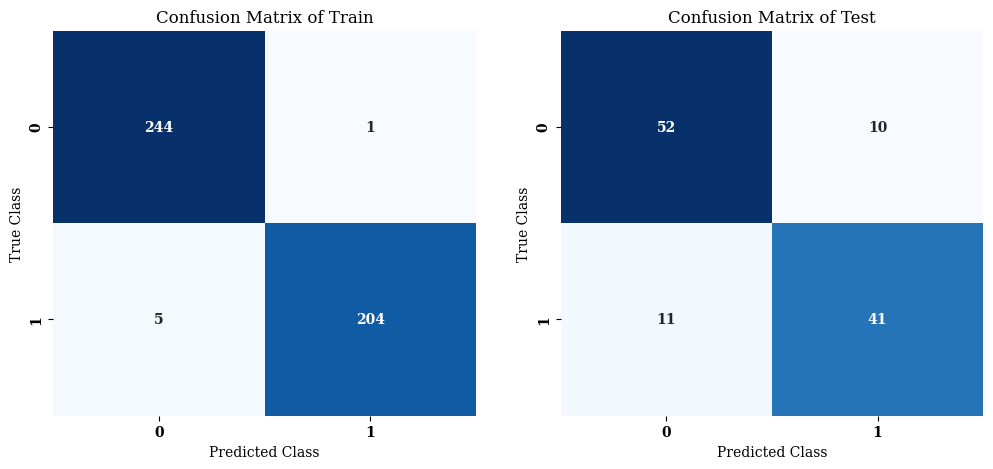

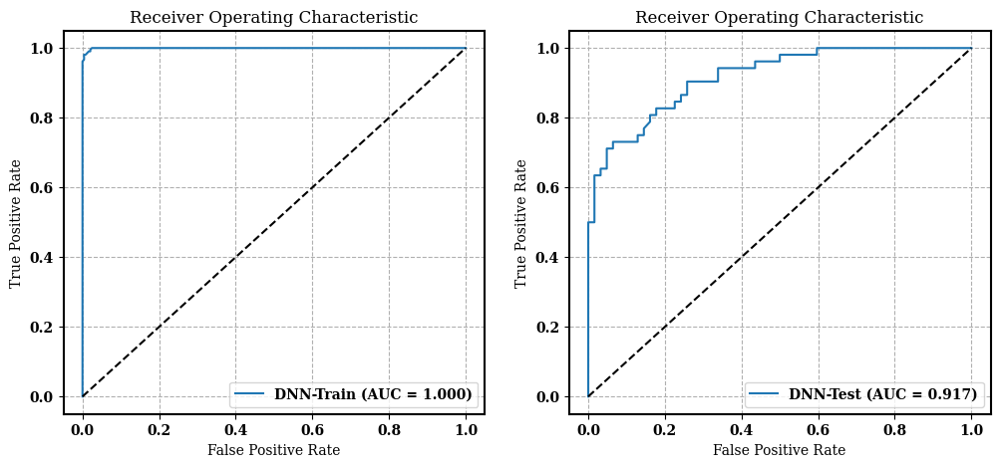

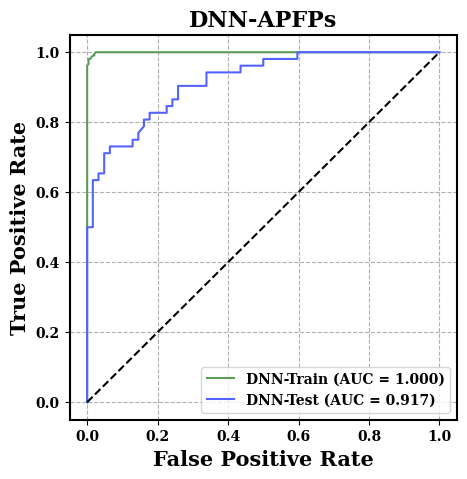

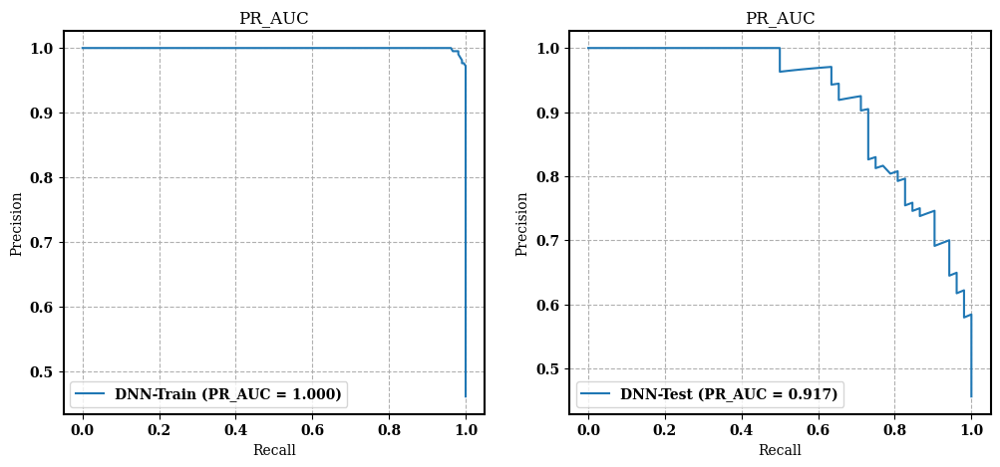

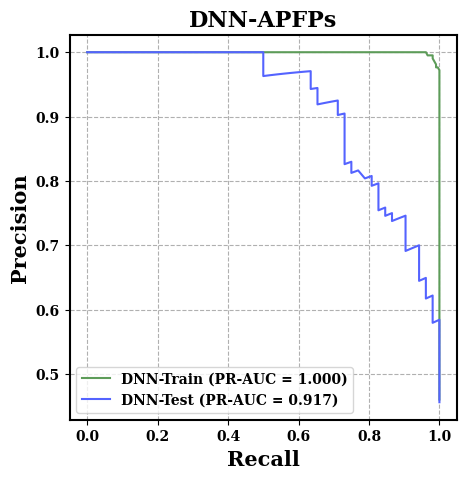

In [52]:
from sklearn.neural_network import MLPClassifier
train_X = x_mor_train  # 训练集特征数据
train_Y = y_mor_train  # 训练集目标数据（标签）
test_X = x_mor_test    # 测试集特征数据
test_Y = y_mor_test    # 测试集目标数据（标签）

mlp = MLPClassifier(
    random_state=0,
    activation='relu',
    hidden_layer_sizes = (65,200,110),
    learning_rate = 'constant',
    solver = 'adam'
)
# 训练模型
estimator = mlp
estimator.fit(train_X, train_Y)
# 在训练集和测试集上进行预测
clf_train = estimator.predict(train_X)
clf_test = estimator.predict(test_X)
print(f"训练集准确度是{accuracy_score(train_Y,clf_train)}")
print(f"测试集准确度是{accuracy_score(test_Y,clf_test)}")

# 生成训练集和测试集的混淆矩阵
train_matrix = confusion_matrix(train_Y, clf_train)
test_matrix = confusion_matrix(test_Y, clf_test)
# 绘制混淆矩阵
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(train_matrix, annot=True, cmap="Blues", cbar=None,fmt="d") 
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Train")
plt.subplot(1, 2, 2)
sns.heatmap(test_matrix, annot=True, cmap="Blues", cbar=None,fmt="d")
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.title("Confusion Matrix of Test")
plt.savefig("./DNN/混淆矩阵_DNN.svg", dpi = 600)
plt.show()

#########  ROC
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(12, 5))
# 训练集 ROC 图
plt.subplot(1, 2, 1)
y_pro_train = estimator.predict_proba(train_X)[:, 1]  # 获取训练集的预测概率
fpr_train, tpr_train, _ = roc_curve(train_Y, y_pro_train)  # 计算 ROC 曲线的参数
roc_auc_train = auc(fpr_train, tpr_train)  # 计算 AUC
plt.plot(fpr_train, tpr_train, label='DNN-Train (AUC = %0.3f)' % roc_auc_train)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
# 绘制测试集 ROC 图
plt.subplot(1, 2, 2)
y_pro_test = estimator.predict_proba(test_X)[:, 1]  # 获取测试集的预测概率
fpr_test, tpr_test, _ = roc_curve(test_Y, y_pro_test)  # 计算 ROC 曲线的参数
roc_auc_test = auc(fpr_test, tpr_test)  # 计算 AUC
plt.plot(fpr_test, tpr_test, label='DNN-Test (AUC = %0.3f)' % roc_auc_test)  # 绘制 ROC 曲线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色  # 绘制对角线
plt.title('Receiver Operating Characteristic')  # 设置标题
plt.xlabel('False Positive Rate')  # 设置横坐标标签
plt.ylabel('True Positive Rate')  # 设置纵坐标标签
plt.legend(loc='lower right')  # 设置图例位置
plt.gca().spines['top'].set_visible(True)  # 显示顶部边框
plt.gca().spines['right'].set_visible(True)  # 显示右侧边框
# 添加背景网格
plt.grid(True, linestyle='--')
plt.savefig("./DNN/AUC_ROC.svg", dpi=600)  # 保存图形为 SVG 格式文件
plt.show()  # 显示图形

##绘制组合图
plt.figure(figsize=(5, 5))
# 绘制 ROC 曲线
plt.plot(fpr_train, tpr_train,color='#5D9C59', label='DNN-Train (AUC = %0.3f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test,color='#5463FF', label='DNN-Test (AUC = %0.3f)' % roc_auc_test)
# 绘制对角线
plt.plot([0, 1], [0, 1], '--', color='black')  #颜色
# 添加背景网格
plt.grid(True, linestyle='--')
# 设置标题和标签
plt.title('DNN-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('False Positive Rate', fontweight='bold', fontsize=15)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize=15)
plt.legend(loc='lower right')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./DNN/AUC_ROC_组合.svg", dpi=600)
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score, auc
import matplotlib.pyplot as plt
# 训练集PR_AUC图
plt.figure(figsize=(12, 5))
y_pro_train = estimator.predict_proba(train_X)[:, 1]
precision_train, recall_train, _ = precision_recall_curve(train_Y, y_pro_train, pos_label=1)
pr_auc_train = auc(recall_train, precision_train)
plt.subplot(1, 2, 1)
plt.plot(recall_train, precision_train, label='DNN-Train (PR_AUC = {:.3f})'.format(pr_auc_train))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)

# 测试集PR_AUC图
y_pro_test = estimator.predict_proba(test_X)[:, 1]
precision_test, recall_test, _ = precision_recall_curve(test_Y, y_pro_test, pos_label=1)
pr_auc_test = auc(recall_test, precision_test)
plt.subplot(1, 2, 2)
plt.plot(recall_test, precision_test, label='DNN-Test (PR_AUC = {:.3f})'.format(pr_auc_test))
plt.title('PR_AUC')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./DNN/PR_AUC.svg", dpi=600)
plt.show()

plt.figure(figsize=(5, 5))
# 绘制训练集PR_AUC图
plt.plot(recall_train, precision_train,color='#5D9C59', label='DNN-Train (PR-AUC = {:.3f})'.format(pr_auc_train))
# 绘制测试集PR_AUC图
plt.plot(recall_test, precision_test,color='#5463FF', label='DNN-Test (PR-AUC = {:.3f})'.format(pr_auc_test))
plt.title('DNN-APFPs', fontweight='bold', fontsize=16)
plt.xlabel('Recall', fontweight='bold', fontsize=15)
plt.ylabel('Precision', fontweight='bold', fontsize=15)
plt.legend(loc="lower left")
plt.grid(True, linestyle='--')
plt.gca().spines['top'].set_visible(True)
plt.gca().spines['right'].set_visible(True)
plt.savefig("./DNN/PR_AUC_组合.svg", dpi=600)
plt.show()

### 交叉验证 测试集

In [53]:
# 忽略特定类型的警告
warnings.filterwarnings("ignore", category=DataConversionWarning)

# 导入机器学习库scikit-learn中的XGB分类器和其他必要的工具包
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    roc_auc_score, f1_score, matthews_corrcoef, 
    make_scorer, confusion_matrix
)
import pandas as pd  # 导入数据处理库pandas
import numpy as np  # 导入数值计算库numpy

# 定义特异性评分函数
def specificity_score(y_true, y_pred):
    """计算特异性（Specificity）."""
    tn, fp, _, _ = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp) if (tn + fp) != 0 else 0

# 定义一个函数用于保存训练集交叉验证的分数到CSV文件，并且打印/保存平均值。
def save_cv_scores(scores, column_names, file_path, label):
    """将交叉验证的成绩保存到CSV文件中。"""
    data = pd.DataFrame(np.array(scores).reshape(1, -1), index=[label], columns=column_names)
    data['average'] = data.mean(axis=1)  # 计算平均分并添加为新列
    data.to_csv(file_path, index=False)  # 将DataFrame保存为CSV文件
    print(f"Data saved to {file_path}")  # 打印保存信息
    return data

# 定义一个函数来处理所有成绩指标并使用`save_cv_scores`函数保存它们。
# 修改process_all_scores函数，添加n_splits参数以反映正确的折数。
def process_all_scores(score_dict, algorithm_name, folder, n_splits):
    """处理所有成绩指标并将其保存到CSV文件中。"""
    results = {}
    for metric, values in score_dict.items():
        file_path = f"{folder}/{n_splits}-CV-{metric.upper()}.csv"  # 使用传入的n_splits来构造文件名
        columns = [str(i+1) for i in range(len(values))]  # 创建列名列表
        results[metric] = save_cv_scores(values, columns, file_path, algorithm_name)  # 保存成绩并添加到结果字典
    return results

mlp = MLPClassifier(
    random_state=0,
    activation='relu',
    hidden_layer_sizes = (65,200,110),
    learning_rate = 'constant',
    solver = 'adam'
)

# 使用XGB分类器进行训练和预测。
def train_and_evaluate(model, train_features, train_labels, test_features, test_labels):
    """训练模型并评估其在训练集和测试集上的性能。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    # 打印训练集和测试集的准确率
    print(f"Training Set Accuracy: {accuracy_score(train_labels, clf_train_preds)}")
    print(f"Test Set Accuracy: {accuracy_score(test_labels, clf_test_preds)}")

# 初始化用于训练和测试的特征和标签变量。
train_X, train_Y = x_mor_train, y_mor_train  # 训练集特征和标签
test_X, test_Y = x_mor_test, y_mor_test  # 测试集特征和标签

# 执行训练和评估。
train_and_evaluate(mlp, train_X, train_Y, test_X, test_Y)

# 定义一个函数进行交叉验证和成绩的保存。
# 修改perform_cross_validation函数的调用，传入n_splits参数。
def perform_cross_validation(model, train_features, train_labels, n_splits, folder):
    """执行交叉验证和成绩处理。"""
    cv_strategy = StratifiedKFold(n_splits=n_splits)  # 使用分层k折交叉验证
    # 定义评分方法
    scoring_methods = {
        'accuracy': 'accuracy',
        'precision': make_scorer(precision_score, average='macro'),
        'recall': make_scorer(recall_score, average='macro'),
        'roc_auc': 'roc_auc_ovr',
        'f1': make_scorer(f1_score, average='macro'),
        'matthews_corrcoef': make_scorer(matthews_corrcoef),
        'specificity': make_scorer(specificity_score)  # 添加特异性评分
    }
    # 执行交叉验证
    scores = cross_validate(model, train_features, train_labels, scoring=scoring_methods, cv=cv_strategy)
    # 格式化分数并返回结果
    formatted_scores = {key.split('_')[-1]: scores[key] for key in scores if key.startswith('test_')}
    # 注意这里传入n_splits
    return process_all_scores(formatted_scores, model.__class__.__name__, folder, n_splits)

# 执行5折交叉验证然后是10折交叉验证。
# 注意这里传入n_splits参数到process_all_scores函数。
results_5_fold = perform_cross_validation(mlp, train_X, train_Y, 5, "./DNN")  # 5折交叉验证结果
results_10_fold = perform_cross_validation(mlp, train_X, train_Y, 10, "./DNN")  # 10折交叉验证结果 

Training Set Accuracy: 0.986784140969163
Test Set Accuracy: 0.8157894736842105
Data saved to ./DNN/5-CV-ACCURACY.csv
Data saved to ./DNN/5-CV-PRECISION.csv
Data saved to ./DNN/5-CV-RECALL.csv
Data saved to ./DNN/5-CV-AUC.csv
Data saved to ./DNN/5-CV-F1.csv
Data saved to ./DNN/5-CV-CORRCOEF.csv
Data saved to ./DNN/5-CV-SPECIFICITY.csv
Data saved to ./DNN/10-CV-ACCURACY.csv
Data saved to ./DNN/10-CV-PRECISION.csv
Data saved to ./DNN/10-CV-RECALL.csv
Data saved to ./DNN/10-CV-AUC.csv
Data saved to ./DNN/10-CV-F1.csv
Data saved to ./DNN/10-CV-CORRCOEF.csv
Data saved to ./DNN/10-CV-SPECIFICITY.csv


In [54]:
import pandas as pd

def train_and_evaluate(model, train_features, train_labels, test_features, test_labels, output_file):
    """训练模型并评估其在训练集和测试集上的性能，包括多种评估指标，并将结果保存到CSV文件。"""
    model.fit(train_features, train_labels)  # 训练模型
    clf_train_preds = model.predict(train_features)  # 在训练集上进行预测
    clf_test_preds = model.predict(test_features)  # 在测试集上进行预测
    
    # 计算训练集上的性能指标
    metrics = {
        'Train_Accuracy': accuracy_score(train_labels, clf_train_preds),
        'Train_Precision': precision_score(train_labels, clf_train_preds, average='macro'),
        'Train_Recall': recall_score(train_labels, clf_train_preds, average='macro'),
        'Train_F1': f1_score(train_labels, clf_train_preds, average='macro'),
        'Train_MCC': matthews_corrcoef(train_labels, clf_train_preds),
        'Train_Specificity': specificity_score(train_labels, clf_train_preds),
        'Train_ROC_AUC': roc_auc_score(train_labels, model.predict_proba(train_features)[:, 1], multi_class='ovr'),
        
        'Test_Accuracy': accuracy_score(test_labels, clf_test_preds),
        'Test_Precision': precision_score(test_labels, clf_test_preds, average='macro'),
        'Test_Recall': recall_score(test_labels, clf_test_preds, average='macro'),
        'Test_F1': f1_score(test_labels, clf_test_preds, average='macro'),
        'Test_MCC': matthews_corrcoef(test_labels, clf_test_preds),
        'Test_Specificity': specificity_score(test_labels, clf_test_preds),
        'Test_ROC_AUC': roc_auc_score(test_labels, model.predict_proba(test_features)[:, 1], multi_class='ovr')
    }
    
    # 将字典转换为DataFrame并保存到CSV文件
    df = pd.DataFrame([metrics])
    df.to_csv(output_file, index=False)
    print(f"Metrics saved to {output_file}")

# 执行训练和评估，输出结果
train_and_evaluate(mlp, train_X, train_Y, test_X, test_Y,"./DNN/训练和评估.csv")

Metrics saved to ./DNN/训练和评估.csv


#  绘图

#### 5-fold交叉验证

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 从CSV文件加载数据
data = pd.read_csv('./绘图/5-CV.csv')

# 假设CSV文件中的列名为'model'和'AUC-ROC'
x = data['model']
values = data['AUC-ROC']

# 设置绘图
plt.figure(figsize=(6, 5))  # 可选：指定图形大小
plt.title('5-fold Cross-Validation', fontsize=15)  # 设置图表标题和标题字体大小
plt.ylim(0, 1.0)  # 设置y轴的范围
plt.xlabel('Model', fontsize=14, fontweight='bold')  # 设置x轴标签，字体大小和字体粗细
plt.ylabel('AUC-ROC', fontsize=14, fontweight='bold')  # 设置y轴标签，字体大小和字体粗细

# 使用colormap生成颜色渐变，但限制色彩变化
cmap = plt.get_cmap('Blues')
color_start = 0.3  # 开始颜色的强度
color_end = 0.5   # 结束颜色的强度
colors = [cmap(color_start + (color_end - color_start) * i / len(x)) for i in range(len(x))]

# 绘制柱状图，并为每根柱子指定颜色和宽度
bar_width = 0.6  # 设置柱子的宽度
bars = plt.bar(x, values, color=colors, width=bar_width)  # 增加width参数来设置宽度

plt.gca().xaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.2)
plt.gca().yaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.2)
# 在每根柱子上添加文本
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 3), ha='center', va='bottom', rotation=90)  # 添加文本并设置垂直对齐
    #round(yval, 2)：这是要显示的文本内容，将 yval 四舍五入到小数点后两位

# 设置边框加粗
ax = plt.gca()  # 获取当前的Axes对象
[ax.spines[spine].set_linewidth(1.5) for spine in ax.spines]  # 加粗所有边框

plt.savefig("./绘图/5-CV.svg",bbox_inches="tight")
plt.show()  # 显示图表

#### 10-fold交叉验证

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 从CSV文件加载数据
data = pd.read_csv('./绘图/10-CV.csv')

# 假设CSV文件中的列名为'model'和'AUC-ROC'
x = data['model']
values = data['AUC-ROC']

# 设置绘图
plt.figure(figsize=(6, 5))  # 可选：指定图形大小
plt.title('10-fold Cross-Validation', fontsize=15)  # 设置图表标题和标题字体大小
plt.ylim(0, 1.0)  # 设置y轴的范围
plt.xlabel('Model', fontsize=14, fontweight='bold')  # 设置x轴标签，字体大小和字体粗细
plt.ylabel('AUC-ROC', fontsize=14, fontweight='bold')  # 设置y轴标签，字体大小和字体粗细

# 使用colormap生成颜色渐变，但限制色彩变化
cmap = plt.get_cmap('Blues')
color_start = 0.3  # 开始颜色的强度
color_end = 0.5   # 结束颜色的强度
colors = [cmap(color_start + (color_end - color_start) * i / len(x)) for i in range(len(x))]

# 绘制柱状图，并为每根柱子指定颜色和宽度
bar_width = 0.6  # 设置柱子的宽度
bars = plt.bar(x, values, color=colors, width=bar_width)  # 增加width参数来设置宽度
plt.gca().xaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.2)
plt.gca().yaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.2)

# 在每根柱子上添加文本
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 3), ha='center', va='bottom', rotation=90)  # 添加文本并设置垂直对齐
    #round(yval, 2)：这是要显示的文本内容，将 yval 四舍五入到小数点后两位

# 设置边框加粗
ax = plt.gca()  # 获取当前的Axes对象
[ax.spines[spine].set_linewidth(1.5) for spine in ax.spines]  # 加粗所有边框

plt.savefig("./绘图/10-CV.svg",bbox_inches="tight")
plt.show()  # 显示图表

#### 箱型图

##### 作者：lne的科研记录本
##### 链接：https://www.zhihu.com/question/486921343/answer/2785783712
##### 来源：知乎

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# 数据导入
data = pd.read_csv('./绘图/箱型图.csv')

# 设置画布
plt.figure(figsize=(6, 5))
plt.title('5-fold Cross-Validation', fontsize=15)  # 设置图表标题和标题字体大小
plt.ylim(0.7, 1.0)  # 设置y轴的范围
plt.xlabel('Model', fontsize=14, fontweight='bold')  # 设置x轴标签，字体大小和字体粗细
plt.ylabel('AUC-ROC', fontsize=14, fontweight='bold')  # 设置y轴标签，字体大小和字体粗细

# 箱线图绘制
sns.boxplot(x=data['model'],  # 指定x轴的数据
            y=data['AUC-ROC'],  # 指定y轴的数据
            data=data,  # 指定绘图的数据集
            whiskerprops={'color': 'black', 'linewidth': '0.9'},  # 设置须的大小
            capprops={'color': 'black', 'linewidth': '1.0'},  # 设置顶端线条的大小
            color="black",
            boxprops={"edgecolor": "black", "linewidth": 0.5},  # 设置箱体边缘属性
            orient='v',  # 竖直方向
            linewidth=0.5,
            width=0.4,  # 指定箱子宽度
            showfliers=False,  # 不显示异常值
            flierprops={'markerfacecolor': 'g', 'marker': 'D', 'markersize': 6.0, 'markeredgecolor': 'black'},
            medianprops={'linestyle': '--', 'color': 'black', 'linewidth': '0.7'},  # 中位数线属性
            meanprops={'marker': '+', 'markersize': '6', 'markeredgecolor': 'red', 'markerfacecolor': 'none', 'markeredgewidth': '0.5'})  # 均值属性

# 设置背景颜色和网格
plt.gca().set_facecolor('white')  # 设置背景颜色为白色
plt.gca().yaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.5)  # 设置y轴网格线为虚线，灰色，半透明
plt.gca().xaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.5) 
plt.grid(True)

# 设置边框
ax = plt.gca()
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['top'].set_color('black')
ax.spines['right'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
# 设置边框加粗
ax = plt.gca()  # 获取当前的Axes对象
[ax.spines[spine].set_linewidth(1.5) for spine in ax.spines]  # 加粗所有边框

plt.tight_layout()
plt.savefig("./绘图/5-CV-箱型图.svg", bbox_inches="tight", dpi=600)  # 保存图像，设置DPI为600
plt.show()